In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
data=pd.read_csv('plague.csv')
israel=data[data['Country/Region']=='Israel']
drop_cols=['Province/State', 'Country/Region', 'Lat', 'Long']
date_cols= [x for x in israel.columns if x not in drop_cols]

In [3]:
total=[israel[coli].values[0] for coli in date_cols]
infec=[]
for i in range(1, len(total)):
    infec.append(total[i]-total[i-1])
    
infec=infec[35:]
infec=np.abs(infec)
infec

array([   1,    3,    0,    1,    5,    3,    0,    6,   16,   10,    9,
          4,   28,   28,   21,   31,   26,   39,   74,   44,   76,   15,
        242,  215,  237,  169,  102, 1117,  520,  433,  480,  532,  546,
        738,  696,  719,  597,  428,  583,  451,  377,  338,  343,  358,
        345,  552,  438,  399,  311,  296,  298,  291,  276,  299,  282,
        225,  276,  248,  159,   83,  128,  159,   82,  142,  116,   57,
         27,   53,   32,   65,   61,   33,   19,   29,   39,   23,   39,
         22,   12,    5,   15,   27,   22,   15,   17,   19,    5,   13,
         22,   50,   40,   77,  113,   29,   87,  100,  121,   97,  142,
        127,   78,  140,  179,  173,  240,  191,  184,  149,  136,  198,
        300,  271,  302,  310,  159,  173,  345,  451,  487,  516,  464,
        398,  385,  757,  786,  972, 1146,  939,  821,  831, 1134, 1390,
       1327, 1525, 1409, 1168, 1238, 1720, 1604, 1877, 1939, 1605, 1448,
       1016, 1887, 2006, 2044, 1990, 1830, 1112, 10

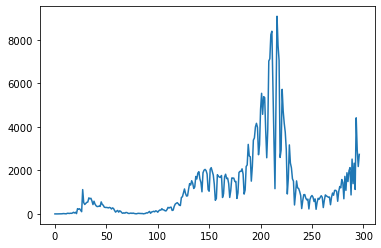

In [4]:
plt.plot(infec)

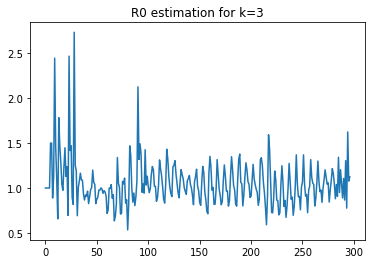

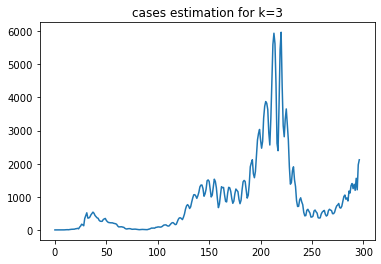

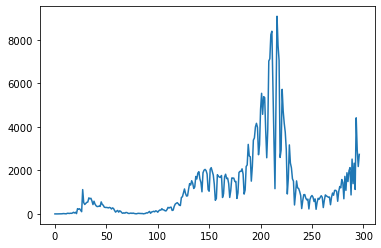

In [224]:
T=len(infec)
t=[1]*T
k=3
t[i]=np.mean(infec[i-k:i])/np.mean(infec[i-k-1:i-1])
for i in range(k+1,T):
    t[i]=np.mean(infec[i-k:i])/np.mean(infec[i-k-1:i-1])

plt.plot(t)
plt.title(f'R0 estimation for k={k}')
plt.show()

predicted= [0] * len(t)
predicted[0]=1

for i in range(1,len(predicted)):
    
    predicted[i]=t[i-1]*predicted[i-1]
    
plt.plot(predicted)
plt.title(f'cases estimation for k={k}')
plt.show()
plt.show()
plt.plot(infec)
plt.show()


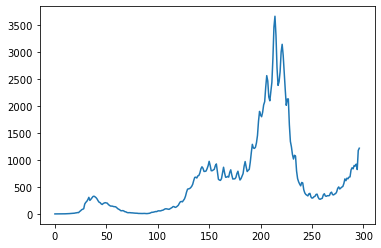

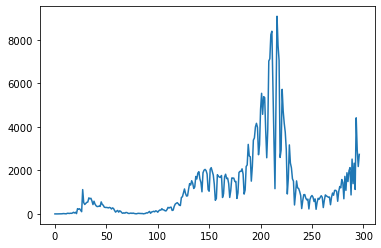

In [207]:
infec

array([   1,    3,    0,    1,    5,    3,    0,    6,   16,   10,    9,
          4,   28,   28,   21,   31,   26,   39,   74,   44,   76,   15,
        242,  215,  237,  169,  102, 1117,  520,  433,  480,  532,  546,
        738,  696,  719,  597,  428,  583,  451,  377,  338,  343,  358,
        345,  552,  438,  399,  311,  296,  298,  291,  276,  299,  282,
        225,  276,  248,  159,   83,  128,  159,   82,  142,  116,   57,
         27,   53,   32,   65,   61,   33,   19,   29,   39,   23,   39,
         22,   12,    5,   15,   27,   22,   15,   17,   19,    5,   13,
         22,   50,   40,   77,  113,   29,   87,  100,  121,   97,  142,
        127,   78,  140,  179,  173,  240,  191,  184,  149,  136,  198,
        300,  271,  302,  310,  159,  173,  345,  451,  487,  516,  464,
        398,  385,  757,  786,  972, 1146,  939,  821,  831, 1134, 1390,
       1327, 1525, 1409, 1168, 1238, 1720, 1604, 1877, 1939, 1605, 1448,
       1016, 1887, 2006, 2044, 1990, 1830, 1112, 10

In [141]:
T=len(infec)
t=[0]*T
p=[0.33,0.33,0.34]
k=3
t[0]=1
i=3
t[1]=p[0]*t[0]
t[2]=p[1]*t[0]+p[0]*t[1]
t[3]=p[2]*t[0]+p[1]*t[1]+p[0]*t[2]
t[4]=p[2]*t[1]+p[1]*t[2]+p[0]*t[3]
t[i]=p[k-1]*t[i-3]+p[k-2]*t[i-2]+p[k-3]*t[i-1]


In [148]:
t[1]=p[0]*infec[0]
t[2]=p[1]*infec[0]+p[0]*infec[1]
t[3]=p[2]*infec[0]+p[1]*infec[1]+p[0]*infec[2]

for i in range(4,T):
    t[i]=p[k-1]*infec[i-3]+p[k-2]*infec[i-2]+p[k-3]*infec[i-1]

In [200]:
r0=[]
for i in range(4,len(infec)):
    rel_up=infec[1:i-2]
    rel_down=t[1:i]
    up=sum(rel_up)
    down=sum(rel_down)
    r0.append(up/down)


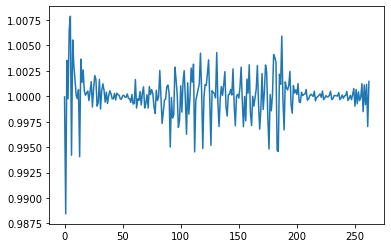

In [201]:
plt.plot(r0[30:])

In [202]:
r00=[r0 for r0 in r0]

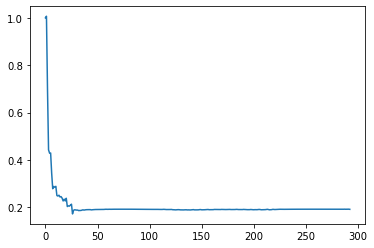

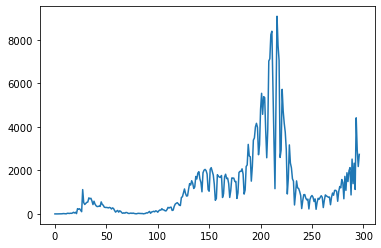

In [203]:
predicted= [0] * len(r00)
predicted[0]=1

for i in range(1,len(predicted)):
    
    predicted[i]=r00[i-1]*predicted[i-1]
    
plt.plot(predicted)
plt.show()
plt.plot(infec)
plt.show()

In [124]:
P=[0.33,0.33,0.34]
k=3

def mle(N,P,k):
    T=len(N)
    up=sum(N[1:])
   
    down=0
    
    print (f'*****T in {T}*****')
    print (f'len t is  {len(N)}') 
    
    for t in range(1,T+1 ):
        print (f'*****t in {t}******')
        
        for j in range(1,(min(t,k))+1):
            print (f'*****j is {j}******')

            print (f't-j is {t-j}')

            print (f'j-1 in {j-1}')
            print (f' N [t-j] {N[t-j]}')
            
            addition=P[j-1]*N[t-j]
            down=down+addition
    
    
    return up/down

In [125]:
mles=[]
for stop in range (2,len(infec)):
    N=infec[:stop]
    g=mle(N,P,k)
    mles.append(g)

*****T in 2*****
len t is  2
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****T in 3*****
len t is  3
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****T in 4*****
len t is  4
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1

j-1 in 2
 N [t-j] 1
*****t in 7******
*****j is 1******
t-j is 6
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 5
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 4
j-1 in 2
 N [t-j] 5
*****t in 8******
*****j is 1******
t-j is 7
j-1 in 0
 N [t-j] 6
*****j is 2******
t-j is 6
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 5
j-1 in 2
 N [t-j] 3
*****t in 9******
*****j is 1******
t-j is 8
j-1 in 0
 N [t-j] 16
*****j is 2******
t-j is 7
j-1 in 1
 N [t-j] 6
*****j is 3******
t-j is 6
j-1 in 2
 N [t-j] 0
*****t in 10******
*****j is 1******
t-j is 9
j-1 in 0
 N [t-j] 10
*****j is 2******
t-j is 8
j-1 in 1
 N [t-j] 16
*****j is 3******
t-j is 7
j-1 in 2
 N [t-j] 6
*****t in 11******
*****j is 1******
t-j is 10
j-1 in 0
 N [t-j] 9
*****j is 2******
t-j is 9
j-1 in 1
 N [t-j] 10
*****j is 3******
t-j is 8
j-1 in 2
 N [t-j] 16
*****t in 12******
*****j is 1******
t-j is 11
j-1 in 0
 N [t-j] 4
*****j is 2******
t-j is 10
j-1 in 1
 N [t-j] 9
*****j is 3******
t-j is 9
j-1 in 2
 N [t-j] 10
*****t in 13**

t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t-j] 237
*****t in 28******
*****j is 1******
t-j is 27
j-1 in 0
 N [t-j] 1117
*****j is 2******
t-j is 26
j-1 in 1
 N [t-j] 102
*****j is 3******
t-j is 25
j-1 in 2
 N [t-j] 169
*****t in 29******
*****j is 1******
t-j is 28
j-1 in 0
 N [t-j] 520
*****j is 2******
t-j is 27
j-1 in 1
 N [t-j] 1117
*****j is 3******
t-j is 26
j-1 in 2
 N [t-j] 102
*****t in 30******
*****j is 1******
t-j is 29
j-1 in 0
 N [t-j] 433
*****j is 2******
t-j is 28
j-1 in 1
 N [t-j] 520
*****j is 3******
t-j is 27
j-1 in 2
 N [t-j] 1117
*****t in 31******
*****j is 1******
t-j is 30
j-1 in 0
 N [t-j] 480
*****j is 2******
t-j is 29
j-1 in 1
 N [t-j] 433
*****j is 3******
t-j is 28
j-1 in 2
 N [t-j] 520
*****t in 32******
*****j is 1******
t-j is 31
j-1 in 0
 N [t-j] 532
*****j is 2******
t-j is 30
j-1 in 1
 N [t-j] 480
*

*****t in 30******
*****j is 1******
t-j is 29
j-1 in 0
 N [t-j] 433
*****j is 2******
t-j is 28
j-1 in 1
 N [t-j] 520
*****j is 3******
t-j is 27
j-1 in 2
 N [t-j] 1117
*****t in 31******
*****j is 1******
t-j is 30
j-1 in 0
 N [t-j] 480
*****j is 2******
t-j is 29
j-1 in 1
 N [t-j] 433
*****j is 3******
t-j is 28
j-1 in 2
 N [t-j] 520
*****t in 32******
*****j is 1******
t-j is 31
j-1 in 0
 N [t-j] 532
*****j is 2******
t-j is 30
j-1 in 1
 N [t-j] 480
*****j is 3******
t-j is 29
j-1 in 2
 N [t-j] 433
*****t in 33******
*****j is 1******
t-j is 32
j-1 in 0
 N [t-j] 546
*****j is 2******
t-j is 31
j-1 in 1
 N [t-j] 532
*****j is 3******
t-j is 30
j-1 in 2
 N [t-j] 480
*****t in 34******
*****j is 1******
t-j is 33
j-1 in 0
 N [t-j] 738
*****j is 2******
t-j is 32
j-1 in 1
 N [t-j] 546
*****j is 3******
t-j is 31
j-1 in 2
 N [t-j] 532
*****t in 35******
*****j is 1******
t-j is 34
j-1 in 0
 N [t-j] 696
*****j is 2******
t-j is 33
j-1 in 1
 N [t-j] 738
*****j is 3******
t-j is 32
j-1 in 

j-1 in 0
 N [t-j] 696
*****j is 2******
t-j is 33
j-1 in 1
 N [t-j] 738
*****j is 3******
t-j is 32
j-1 in 2
 N [t-j] 546
*****t in 36******
*****j is 1******
t-j is 35
j-1 in 0
 N [t-j] 719
*****j is 2******
t-j is 34
j-1 in 1
 N [t-j] 696
*****j is 3******
t-j is 33
j-1 in 2
 N [t-j] 738
*****t in 37******
*****j is 1******
t-j is 36
j-1 in 0
 N [t-j] 597
*****j is 2******
t-j is 35
j-1 in 1
 N [t-j] 719
*****j is 3******
t-j is 34
j-1 in 2
 N [t-j] 696
*****t in 38******
*****j is 1******
t-j is 37
j-1 in 0
 N [t-j] 428
*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
*****j is 1******
t-j is 38
j-1 in 0
 N [t-j] 583
*****j is 2******
t-j is 37
j-1 in 1
 N [t-j] 428
*****j is 3******
t-j is 36
j-1 in 2
 N [t-j] 597
*****t in 40******
*****j is 1******
t-j is 39
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 38
j-1 in 1
 N [t-j] 583
*****j is 3******
t-j is 37
j-1 in 2
 N [t-j] 428
*****t in 41******
*****j is 1***

t-j is 14
j-1 in 2
 N [t-j] 21
*****t in 18******
*****j is 1******
t-j is 17
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j

 N [t-j] 83
*****t in 63******
*****j is 1******
t-j is 62
j-1 in 0
 N [t-j] 82
*****j is 2******
t-j is 61
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 60
j-1 in 2
 N [t-j] 128
*****t in 64******
*****j is 1******
t-j is 63
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 62
j-1 in 1
 N [t-j] 82
*****j is 3******
t-j is 61
j-1 in 2
 N [t-j] 159
*****T in 65*****
len t is  65
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1
*****j is 2******
t-j is 2
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 1
j-1 in 2
 N [t-j] 3
*****t in 5******
*****j is 1******
t-j is 4
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 3
j-1 in 1
 N [t-j] 1
*****j is 3***

 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N 

 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 i

 N [t-j] 82
*****t in 66******
*****j is 1******
t-j is 65
j-1 in 0
 N [t-j] 57
*****j is 2******
t-j is 64
j-1 in 1
 N [t-j] 116
*****j is 3******
t-j is 63
j-1 in 2
 N [t-j] 142
*****t in 67******
*****j is 1******
t-j is 66
j-1 in 0
 N [t-j] 27
*****j is 2******
t-j is 65
j-1 in 1
 N [t-j] 57
*****j is 3******
t-j is 64
j-1 in 2
 N [t-j] 116
*****t in 68******
*****j is 1******
t-j is 67
j-1 in 0
 N [t-j] 53
*****j is 2******
t-j is 66
j-1 in 1
 N [t-j] 27
*****j is 3******
t-j is 65
j-1 in 2
 N [t-j] 57
*****t in 69******
*****j is 1******
t-j is 68
j-1 in 0
 N [t-j] 32
*****j is 2******
t-j is 67
j-1 in 1
 N [t-j] 53
*****j is 3******
t-j is 66
j-1 in 2
 N [t-j] 27
*****t in 70******
*****j is 1******
t-j is 69
j-1 in 0
 N [t-j] 65
*****j is 2******
t-j is 68
j-1 in 1
 N [t-j] 32
*****j is 3******
t-j is 67
j-1 in 2
 N [t-j] 53
*****t in 71******
*****j is 1******
t-j is 70
j-1 in 0
 N [t-j] 61
*****j is 2******
t-j is 69
j-1 in 1
 N [t-j] 65
*****j is 3******
t-j is 68
j-1 in 2
 

*****j is 3******
t-j is 13
j-1 in 2
 N [t-j] 28
*****t in 17******
*****j is 1******
t-j is 16
j-1 in 0
 N [t-j] 26
*****j is 2******
t-j is 15
j-1 in 1
 N [t-j] 31
*****j is 3******
t-j is 14
j-1 in 2
 N [t-j] 21
*****t in 18******
*****j is 1******
t-j is 17
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
****

t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t-j] 237
*****t in 28******
*****j is 1******
t-j is 27
j-1 in 0
 N [t-j] 1117
*****j is 2******
t-j is 26
j-1 in 1
 N [t-j] 102
*****j is 3******
t-j is 25
j-1 in 2
 N [t-j] 169
*****t in 29******
*****j is 1******
t-j is 28
j-1 in 0
 N [t-j] 520
*****j is 2******
t-j is 27
j-1 in 1
 N [t-j] 1117
*****j is 3******
t-j is 26
j-1 in 2
 N [t-j] 102
*****t in 30******
*****j is 1******
t-j is 29
j-1 in 0
 N [t-j] 433
*****j is 2******
t-j is 28
j-1 in 1
 N [t-j] 520
*****j is 3******
t-j is 27
j-1 in 2
 N [t-j] 1117
*****t in 31******
*

t-j is 32
j-1 in 0
 N [t-j] 546
*****j is 2******
t-j is 31
j-1 in 1
 N [t-j] 532
*****j is 3******
t-j is 30
j-1 in 2
 N [t-j] 480
*****t in 34******
*****j is 1******
t-j is 33
j-1 in 0
 N [t-j] 738
*****j is 2******
t-j is 32
j-1 in 1
 N [t-j] 546
*****j is 3******
t-j is 31
j-1 in 2
 N [t-j] 532
*****t in 35******
*****j is 1******
t-j is 34
j-1 in 0
 N [t-j] 696
*****j is 2******
t-j is 33
j-1 in 1
 N [t-j] 738
*****j is 3******
t-j is 32
j-1 in 2
 N [t-j] 546
*****t in 36******
*****j is 1******
t-j is 35
j-1 in 0
 N [t-j] 719
*****j is 2******
t-j is 34
j-1 in 1
 N [t-j] 696
*****j is 3******
t-j is 33
j-1 in 2
 N [t-j] 738
*****t in 37******
*****j is 1******
t-j is 36
j-1 in 0
 N [t-j] 597
*****j is 2******
t-j is 35
j-1 in 1
 N [t-j] 719
*****j is 3******
t-j is 34
j-1 in 2
 N [t-j] 696
*****t in 38******
*****j is 1******
t-j is 37
j-1 in 0
 N [t-j] 428
*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
****

*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t

t-j is 90
j-1 in 0
 N [t-j] 40
*****j is 2******
t-j is 89
j-1 in 1
 N [t-j] 50
*****j is 3******
t-j is 88
j-1 in 2
 N [t-j] 22
*****t in 92******
*****j is 1******
t-j is 91
j-1 in 0
 N [t-j] 77
*****j is 2******
t-j is 90
j-1 in 1
 N [t-j] 40
*****j is 3******
t-j is 89
j-1 in 2
 N [t-j] 50
*****t in 93******
*****j is 1******
t-j is 92
j-1 in 0
 N [t-j] 113
*****j is 2******
t-j is 91
j-1 in 1
 N [t-j] 77
*****j is 3******
t-j is 90
j-1 in 2
 N [t-j] 40
*****t in 94******
*****j is 1******
t-j is 93
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 92
j-1 in 1
 N [t-j] 113
*****j is 3******
t-j is 91
j-1 in 2
 N [t-j] 77
*****t in 95******
*****j is 1******
t-j is 94
j-1 in 0
 N [t-j] 87
*****j is 2******
t-j is 93
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 92
j-1 in 2
 N [t-j] 113
*****t in 96******
*****j is 1******
t-j is 95
j-1 in 0
 N [t-j] 100
*****j is 2******
t-j is 94
j-1 in 1
 N [t-j] 87
*****j is 3******
t-j is 93
j-1 in 2
 N [t-j] 29
*****t in 97******
*****j is 1******


t-j is 50
j-1 in 0
 N [t-j] 298
*****j is 2******
t-j is 49
j-1 in 1
 N [t-j] 296
*****j is 3******
t-j is 48
j-1 in 2
 N [t-j] 311
*****t in 52******
*****j is 1******
t-j is 51
j-1 in 0
 N [t-j] 291
*****j is 2******
t-j is 50
j-1 in 1
 N [t-j] 298
*****j is 3******
t-j is 49
j-1 in 2
 N [t-j] 296
*****t in 53******
*****j is 1******
t-j is 52
j-1 in 0
 N [t-j] 276
*****j is 2******
t-j is 51
j-1 in 1
 N [t-j] 291
*****j is 3******
t-j is 50
j-1 in 2
 N [t-j] 298
*****t in 54******
*****j is 1******
t-j is 53
j-1 in 0
 N [t-j] 299
*****j is 2******
t-j is 52
j-1 in 1
 N [t-j] 276
*****j is 3******
t-j is 51
j-1 in 2
 N [t-j] 291
*****t in 55******
*****j is 1******
t-j is 54
j-1 in 0
 N [t-j] 282
*****j is 2******
t-j is 53
j-1 in 1
 N [t-j] 299
*****j is 3******
t-j is 52
j-1 in 2
 N [t-j] 276
*****t in 56******
*****j is 1******
t-j is 55
j-1 in 0
 N [t-j] 225
*****j is 2******
t-j is 54
j-1 in 1
 N [t-j] 282
*****j is 3******
t-j is 53
j-1 in 2
 N [t-j] 299
*****t in 57******
****

j-1 in 2
 N [t-j] 78
*****t in 104******
*****j is 1******
t-j is 103
j-1 in 0
 N [t-j] 173
*****j is 2******
t-j is 102
j-1 in 1
 N [t-j] 179
*****j is 3******
t-j is 101
j-1 in 2
 N [t-j] 140
*****t in 105******
*****j is 1******
t-j is 104
j-1 in 0
 N [t-j] 240
*****j is 2******
t-j is 103
j-1 in 1
 N [t-j] 173
*****j is 3******
t-j is 102
j-1 in 2
 N [t-j] 179
*****T in 106*****
len t is  106
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1
*****j is 2******
t-j is 2
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 1
j-1 in 2
 N [t-j] 3
*****t in 5******
*****j is 1******
t-j is 4
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 3
j-1 in 1
 N [

j-1 in 2
 N [t-j] 738
*****t in 37******
*****j is 1******
t-j is 36
j-1 in 0
 N [t-j] 597
*****j is 2******
t-j is 35
j-1 in 1
 N [t-j] 719
*****j is 3******
t-j is 34
j-1 in 2
 N [t-j] 696
*****t in 38******
*****j is 1******
t-j is 37
j-1 in 0
 N [t-j] 428
*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
*****j is 1******
t-j is 38
j-1 in 0
 N [t-j] 583
*****j is 2******
t-j is 37
j-1 in 1
 N [t-j] 428
*****j is 3******
t-j is 36
j-1 in 2
 N [t-j] 597
*****t in 40******
*****j is 1******
t-j is 39
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 38
j-1 in 1
 N [t-j] 583
*****j is 3******
t-j is 37
j-1 in 2
 N [t-j] 428
*****t in 41******
*****j is 1******
t-j is 40
j-1 in 0
 N [t-j] 377
*****j is 2******
t-j is 39
j-1 in 1
 N [t-j] 451
*****j is 3******
t-j is 38
j-1 in 2
 N [t-j] 583
*****t in 42******
*****j is 1******
t-j is 41
j-1 in 0
 N [t-j] 338
*****j is 2******
t-j is 40
j-1 in 1
 N [t-j] 377
*****j is 3***

t-j is 61
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 60
j-1 in 1
 N [t-j] 128
*****j is 3******
t-j is 59
j-1 in 2
 N [t-j] 83
*****t in 63******
*****j is 1******
t-j is 62
j-1 in 0
 N [t-j] 82
*****j is 2******
t-j is 61
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 60
j-1 in 2
 N [t-j] 128
*****t in 64******
*****j is 1******
t-j is 63
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 62
j-1 in 1
 N [t-j] 82
*****j is 3******
t-j is 61
j-1 in 2
 N [t-j] 159
*****t in 65******
*****j is 1******
t-j is 64
j-1 in 0
 N [t-j] 116
*****j is 2******
t-j is 63
j-1 in 1
 N [t-j] 142
*****j is 3******
t-j is 62
j-1 in 2
 N [t-j] 82
*****t in 66******
*****j is 1******
t-j is 65
j-1 in 0
 N [t-j] 57
*****j is 2******
t-j is 64
j-1 in 1
 N [t-j] 116
*****j is 3******
t-j is 63
j-1 in 2
 N [t-j] 142
*****t in 67******
*****j is 1******
t-j is 66
j-1 in 0
 N [t-j] 27
*****j is 2******
t-j is 65
j-1 in 1
 N [t-j] 57
*****j is 3******
t-j is 64
j-1 in 2
 N [t-j] 116
*****t in 68******
*****j is 1

t-j is 68
j-1 in 2
 N [t-j] 32
*****t in 72******
*****j is 1******
t-j is 71
j-1 in 0
 N [t-j] 33
*****j is 2******
t-j is 70
j-1 in 1
 N [t-j] 61
*****j is 3******
t-j is 69
j-1 in 2
 N [t-j] 65
*****t in 73******
*****j is 1******
t-j is 72
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 71
j-1 in 1
 N [t-j] 33
*****j is 3******
t-j is 70
j-1 in 2
 N [t-j] 61
*****t in 74******
*****j is 1******
t-j is 73
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 72
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 73
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 72
j-1 in 2
 N [t-j] 19
*****t in 76******
*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 73
j-1 in 2
 N [t-j] 29
*****t in 77******
*****j is 1******
t-j is 76
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 75
j-1 in 1
 N [t-j] 23
*****j is 3******
t-j 

*****j is 1******
t-j is 73
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 72
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 73
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 72
j-1 in 2
 N [t-j] 19
*****t in 76******
*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 73
j-1 in 2
 N [t-j] 29
*****t in 77******
*****j is 1******
t-j is 76
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 75
j-1 in 1
 N [t-j] 23
*****j is 3******
t-j is 74
j-1 in 2
 N [t-j] 39
*****t in 78******
*****j is 1******
t-j is 77
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 76
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 75
j-1 in 2
 N [t-j] 23
*****t in 79******
*****j is 1******
t-j is 78
j-1 in 0
 N [t-j] 12
*****j is 2******
t-j is 77
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 76
j-1 in 2
 N [t-j] 39
*****t in 80******
****

*****j is 2******
t-j is 63
j-1 in 1
 N [t-j] 142
*****j is 3******
t-j is 62
j-1 in 2
 N [t-j] 82
*****t in 66******
*****j is 1******
t-j is 65
j-1 in 0
 N [t-j] 57
*****j is 2******
t-j is 64
j-1 in 1
 N [t-j] 116
*****j is 3******
t-j is 63
j-1 in 2
 N [t-j] 142
*****t in 67******
*****j is 1******
t-j is 66
j-1 in 0
 N [t-j] 27
*****j is 2******
t-j is 65
j-1 in 1
 N [t-j] 57
*****j is 3******
t-j is 64
j-1 in 2
 N [t-j] 116
*****t in 68******
*****j is 1******
t-j is 67
j-1 in 0
 N [t-j] 53
*****j is 2******
t-j is 66
j-1 in 1
 N [t-j] 27
*****j is 3******
t-j is 65
j-1 in 2
 N [t-j] 57
*****t in 69******
*****j is 1******
t-j is 68
j-1 in 0
 N [t-j] 32
*****j is 2******
t-j is 67
j-1 in 1
 N [t-j] 53
*****j is 3******
t-j is 66
j-1 in 2
 N [t-j] 27
*****t in 70******
*****j is 1******
t-j is 69
j-1 in 0
 N [t-j] 65
*****j is 2******
t-j is 68
j-1 in 1
 N [t-j] 32
*****j is 3******
t-j is 67
j-1 in 2
 N [t-j] 53
*****t in 71******
*****j is 1******
t-j is 70
j-1 in 0
 N [t-j] 61


*****t in 49******
*****j is 1******
t-j is 48
j-1 in 0
 N [t-j] 311
*****j is 2******
t-j is 47
j-1 in 1
 N [t-j] 399
*****j is 3******
t-j is 46
j-1 in 2
 N [t-j] 438
*****t in 50******
*****j is 1******
t-j is 49
j-1 in 0
 N [t-j] 296
*****j is 2******
t-j is 48
j-1 in 1
 N [t-j] 311
*****j is 3******
t-j is 47
j-1 in 2
 N [t-j] 399
*****t in 51******
*****j is 1******
t-j is 50
j-1 in 0
 N [t-j] 298
*****j is 2******
t-j is 49
j-1 in 1
 N [t-j] 296
*****j is 3******
t-j is 48
j-1 in 2
 N [t-j] 311
*****t in 52******
*****j is 1******
t-j is 51
j-1 in 0
 N [t-j] 291
*****j is 2******
t-j is 50
j-1 in 1
 N [t-j] 298
*****j is 3******
t-j is 49
j-1 in 2
 N [t-j] 296
*****t in 53******
*****j is 1******
t-j is 52
j-1 in 0
 N [t-j] 276
*****j is 2******
t-j is 51
j-1 in 1
 N [t-j] 291
*****j is 3******
t-j is 50
j-1 in 2
 N [t-j] 298
*****t in 54******
*****j is 1******
t-j is 53
j-1 in 0
 N [t-j] 299
*****j is 2******
t-j is 52
j-1 in 1
 N [t-j] 276
*****j is 3******
t-j is 51
j-1 in 2

j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t-j] 237
*****t in 28******
*****j is 1******
t-j is 27
j-1 in 0
 N [t-j] 1117
*****j is 2******
t-j is 26
j-1 in 1
 N [t-j] 102
*****j is 3******
t-j is 25
j-1 in 2
 N [t-j] 169
*****t in 29******
*****j is 1******
t-j is 28
j-1 in 0
 N [t-j] 520
*****j is 2******
t-j is 27
j-1 in 1
 N [t-j] 1117
*****j is 3******
t-j is 26
j-1 in 2
 N [t-j] 102
*****t in 30******
*****j is 1******
t-j is 29
j-1 in 0
 N [t-j] 433
*****j is 2******
t-j is 28
j-1 in 1
 N [t-j] 520
*****j is 3******
t-j is 27
j-1 in 2
 N [t-j] 1117
*****t in 31******
*****j is 1******
t-j is 30
j-1 in 0
 N [t-j] 480
*****j is 2******
t-j is 29
j-1 in 1
 N [t-j] 433
*****j is 3

j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 62
j-1 in 1
 N [t-j] 82
*****j is 3******
t-j is 61
j-1 in 2
 N [t-j] 159
*****t in 65******
*****j is 1******
t-j is 64
j-1 in 0
 N [t-j] 116
*****j is 2******
t-j is 63
j-1 in 1
 N [t-j] 142
*****j is 3******
t-j is 62
j-1 in 2
 N [t-j] 82
*****t in 66******
*****j is 1******
t-j is 65
j-1 in 0
 N [t-j] 57
*****j is 2******
t-j is 64
j-1 in 1
 N [t-j] 116
*****j is 3******
t-j is 63
j-1 in 2
 N [t-j] 142
*****t in 67******
*****j is 1******
t-j is 66
j-1 in 0
 N [t-j] 27
*****j is 2******
t-j is 65
j-1 in 1
 N [t-j] 57
*****j is 3******
t-j is 64
j-1 in 2
 N [t-j] 116
*****t in 68******
*****j is 1******
t-j is 67
j-1 in 0
 N [t-j] 53
*****j is 2******
t-j is 66
j-1 in 1
 N [t-j] 27
*****j is 3******
t-j is 65
j-1 in 2
 N [t-j] 57
*****t in 69******
*****j is 1******
t-j is 68
j-1 in 0
 N [t-j] 32
*****j is 2******
t-j is 67
j-1 in 1
 N [t-j] 53
*****j is 3******
t-j is 66
j-1 in 2
 N [t-j] 27
*****t in 70******
*****j is 1******
t-j is 

*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t-j] 237
*****t in 2

*****t in 112******
*****j is 1******
t-j is 111
j-1 in 0
 N [t-j] 271
*****j is 2******
t-j is 110
j-1 in 1
 N [t-j] 300
*****j is 3******
t-j is 109
j-1 in 2
 N [t-j] 198
*****t in 113******
*****j is 1******
t-j is 112
j-1 in 0
 N [t-j] 302
*****j is 2******
t-j is 111
j-1 in 1
 N [t-j] 271
*****j is 3******
t-j is 110
j-1 in 2
 N [t-j] 300
*****t in 114******
*****j is 1******
t-j is 113
j-1 in 0
 N [t-j] 310
*****j is 2******
t-j is 112
j-1 in 1
 N [t-j] 302
*****j is 3******
t-j is 111
j-1 in 2
 N [t-j] 271
*****t in 115******
*****j is 1******
t-j is 114
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 113
j-1 in 1
 N [t-j] 310
*****j is 3******
t-j is 112
j-1 in 2
 N [t-j] 302
*****t in 116******
*****j is 1******
t-j is 115
j-1 in 0
 N [t-j] 173
*****j is 2******
t-j is 114
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 113
j-1 in 2
 N [t-j] 310
*****t in 117******
*****j is 1******
t-j is 116
j-1 in 0
 N [t-j] 345
*****j is 2******
t-j is 115
j-1 in 1
 N [t-j] 173
*****j is 3**

j-1 in 2
 N [t-j] 282
*****t in 58******
*****j is 1******
t-j is 57
j-1 in 0
 N [t-j] 248
*****j is 2******
t-j is 56
j-1 in 1
 N [t-j] 276
*****j is 3******
t-j is 55
j-1 in 2
 N [t-j] 225
*****t in 59******
*****j is 1******
t-j is 58
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 57
j-1 in 1
 N [t-j] 248
*****j is 3******
t-j is 56
j-1 in 2
 N [t-j] 276
*****t in 60******
*****j is 1******
t-j is 59
j-1 in 0
 N [t-j] 83
*****j is 2******
t-j is 58
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 57
j-1 in 2
 N [t-j] 248
*****t in 61******
*****j is 1******
t-j is 60
j-1 in 0
 N [t-j] 128
*****j is 2******
t-j is 59
j-1 in 1
 N [t-j] 83
*****j is 3******
t-j is 58
j-1 in 2
 N [t-j] 159
*****t in 62******
*****j is 1******
t-j is 61
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 60
j-1 in 1
 N [t-j] 128
*****j is 3******
t-j is 59
j-1 in 2
 N [t-j] 83
*****t in 63******
*****j is 1******
t-j is 62
j-1 in 0
 N [t-j] 82
*****j is 2******
t-j is 61
j-1 in 1
 N [t-j] 159
*****j is 3******


*****t in 111******
*****j is 1******
t-j is 110
j-1 in 0
 N [t-j] 300
*****j is 2******
t-j is 109
j-1 in 1
 N [t-j] 198
*****j is 3******
t-j is 108
j-1 in 2
 N [t-j] 136
*****t in 112******
*****j is 1******
t-j is 111
j-1 in 0
 N [t-j] 271
*****j is 2******
t-j is 110
j-1 in 1
 N [t-j] 300
*****j is 3******
t-j is 109
j-1 in 2
 N [t-j] 198
*****t in 113******
*****j is 1******
t-j is 112
j-1 in 0
 N [t-j] 302
*****j is 2******
t-j is 111
j-1 in 1
 N [t-j] 271
*****j is 3******
t-j is 110
j-1 in 2
 N [t-j] 300
*****t in 114******
*****j is 1******
t-j is 113
j-1 in 0
 N [t-j] 310
*****j is 2******
t-j is 112
j-1 in 1
 N [t-j] 302
*****j is 3******
t-j is 111
j-1 in 2
 N [t-j] 271
*****t in 115******
*****j is 1******
t-j is 114
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 113
j-1 in 1
 N [t-j] 310
*****j is 3******
t-j is 112
j-1 in 2
 N [t-j] 302
*****t in 116******
*****j is 1******
t-j is 115
j-1 in 0
 N [t-j] 173
*****j is 2******
t-j is 114
j-1 in 1
 N [t-j] 159
*****j is 3**

j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t-j] 237
*****t in 28******
*****j is 1******
t-j is 27
j-1 in 0
 N [t-j] 1117
*****j is 2******
t-j is 26
j-1 in 1
 N [t-j] 102
*****j is 3******
t-j is 25
j-1 in 2
 N [t-j] 169
*****t in 29******
*****j is 1******
t-j is 28
j-1 in 0
 N [t-j] 520
*****j is 2******
t-j is 27
j-1 in 1
 N [t-j] 1117
*****j is 3******
t-j is 26
j-1 in 2
 N [t-j] 102
*****t in 30******
*****j is 1******
t-j is 29
j-1 in 0
 N [t-j] 433
*****j is 2******
t-j is 28
j-1 in 1
 N [t-j] 520
*****j is 3******
t-j is 27
j-1 in 2
 N [t-j] 1117
*****t in 31******
*****j is 1******
t-j is 30
j-1 in 0
 N [t-j] 480
*****j is 2

 N [t-j] 33
*****j is 3******
t-j is 70
j-1 in 2
 N [t-j] 61
*****t in 74******
*****j is 1******
t-j is 73
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 72
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 73
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 72
j-1 in 2
 N [t-j] 19
*****t in 76******
*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 73
j-1 in 2
 N [t-j] 29
*****t in 77******
*****j is 1******
t-j is 76
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 75
j-1 in 1
 N [t-j] 23
*****j is 3******
t-j is 74
j-1 in 2
 N [t-j] 39
*****t in 78******
*****j is 1******
t-j is 77
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 76
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 75
j-1 in 2
 N [t-j] 23
*****t in 79******
*****j is 1******
t-j is 78
j-1 in 0
 N [t-j] 12
*****j is 2******
t-j is 77
j-1 in 1
 N [

t-j is 129
j-1 in 0
 N [t-j] 831
*****j is 2******
t-j is 128
j-1 in 1
 N [t-j] 821
*****j is 3******
t-j is 127
j-1 in 2
 N [t-j] 939
*****t in 131******
*****j is 1******
t-j is 130
j-1 in 0
 N [t-j] 1134
*****j is 2******
t-j is 129
j-1 in 1
 N [t-j] 831
*****j is 3******
t-j is 128
j-1 in 2
 N [t-j] 821
*****t in 132******
*****j is 1******
t-j is 131
j-1 in 0
 N [t-j] 1390
*****j is 2******
t-j is 130
j-1 in 1
 N [t-j] 1134
*****j is 3******
t-j is 129
j-1 in 2
 N [t-j] 831
*****t in 133******
*****j is 1******
t-j is 132
j-1 in 0
 N [t-j] 1327
*****j is 2******
t-j is 131
j-1 in 1
 N [t-j] 1390
*****j is 3******
t-j is 130
j-1 in 2
 N [t-j] 1134
*****t in 134******
*****j is 1******
t-j is 133
j-1 in 0
 N [t-j] 1525
*****j is 2******
t-j is 132
j-1 in 1
 N [t-j] 1327
*****j is 3******
t-j is 131
j-1 in 2
 N [t-j] 1390
*****t in 135******
*****j is 1******
t-j is 134
j-1 in 0
 N [t-j] 1409
*****j is 2******
t-j is 133
j-1 in 1
 N [t-j] 1525
*****j is 3******
t-j is 132
j-1 in 2
 N

*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*

t-j is 67
j-1 in 0
 N [t-j] 53
*****j is 2******
t-j is 66
j-1 in 1
 N [t-j] 27
*****j is 3******
t-j is 65
j-1 in 2
 N [t-j] 57
*****t in 69******
*****j is 1******
t-j is 68
j-1 in 0
 N [t-j] 32
*****j is 2******
t-j is 67
j-1 in 1
 N [t-j] 53
*****j is 3******
t-j is 66
j-1 in 2
 N [t-j] 27
*****t in 70******
*****j is 1******
t-j is 69
j-1 in 0
 N [t-j] 65
*****j is 2******
t-j is 68
j-1 in 1
 N [t-j] 32
*****j is 3******
t-j is 67
j-1 in 2
 N [t-j] 53
*****t in 71******
*****j is 1******
t-j is 70
j-1 in 0
 N [t-j] 61
*****j is 2******
t-j is 69
j-1 in 1
 N [t-j] 65
*****j is 3******
t-j is 68
j-1 in 2
 N [t-j] 32
*****t in 72******
*****j is 1******
t-j is 71
j-1 in 0
 N [t-j] 33
*****j is 2******
t-j is 70
j-1 in 1
 N [t-j] 61
*****j is 3******
t-j is 69
j-1 in 2
 N [t-j] 65
*****t in 73******
*****j is 1******
t-j is 72
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 71
j-1 in 1
 N [t-j] 33
*****j is 3******
t-j is 70
j-1 in 2
 N [t-j] 61
*****t in 74******
*****j is 1******
t-j 

*****j is 1******
t-j is 94
j-1 in 0
 N [t-j] 87
*****j is 2******
t-j is 93
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 92
j-1 in 2
 N [t-j] 113
*****t in 96******
*****j is 1******
t-j is 95
j-1 in 0
 N [t-j] 100
*****j is 2******
t-j is 94
j-1 in 1
 N [t-j] 87
*****j is 3******
t-j is 93
j-1 in 2
 N [t-j] 29
*****t in 97******
*****j is 1******
t-j is 96
j-1 in 0
 N [t-j] 121
*****j is 2******
t-j is 95
j-1 in 1
 N [t-j] 100
*****j is 3******
t-j is 94
j-1 in 2
 N [t-j] 87
*****t in 98******
*****j is 1******
t-j is 97
j-1 in 0
 N [t-j] 97
*****j is 2******
t-j is 96
j-1 in 1
 N [t-j] 121
*****j is 3******
t-j is 95
j-1 in 2
 N [t-j] 100
*****t in 99******
*****j is 1******
t-j is 98
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 97
j-1 in 1
 N [t-j] 97
*****j is 3******
t-j is 96
j-1 in 2
 N [t-j] 121
*****t in 100******
*****j is 1******
t-j is 99
j-1 in 0
 N [t-j] 127
*****j is 2******
t-j is 98
j-1 in 1
 N [t-j] 142
*****j is 3******
t-j is 97
j-1 in 2
 N [t-j] 97
*****t in 10

*****j is 3******
t-j is 119
j-1 in 2
 N [t-j] 516
*****t in 123******
*****j is 1******
t-j is 122
j-1 in 0
 N [t-j] 385
*****j is 2******
t-j is 121
j-1 in 1
 N [t-j] 398
*****j is 3******
t-j is 120
j-1 in 2
 N [t-j] 464
*****t in 124******
*****j is 1******
t-j is 123
j-1 in 0
 N [t-j] 757
*****j is 2******
t-j is 122
j-1 in 1
 N [t-j] 385
*****j is 3******
t-j is 121
j-1 in 2
 N [t-j] 398
*****t in 125******
*****j is 1******
t-j is 124
j-1 in 0
 N [t-j] 786
*****j is 2******
t-j is 123
j-1 in 1
 N [t-j] 757
*****j is 3******
t-j is 122
j-1 in 2
 N [t-j] 385
*****t in 126******
*****j is 1******
t-j is 125
j-1 in 0
 N [t-j] 972
*****j is 2******
t-j is 124
j-1 in 1
 N [t-j] 786
*****j is 3******
t-j is 123
j-1 in 2
 N [t-j] 757
*****t in 127******
*****j is 1******
t-j is 126
j-1 in 0
 N [t-j] 1146
*****j is 2******
t-j is 125
j-1 in 1
 N [t-j] 972
*****j is 3******
t-j is 124
j-1 in 2
 N [t-j] 786
*****t in 128******
*****j is 1******
t-j is 127
j-1 in 0
 N [t-j] 939
*****j is 2*

*****j is 2******
t-j is 140
j-1 in 1
 N [t-j] 1939
*****j is 3******
t-j is 139
j-1 in 2
 N [t-j] 1877
*****t in 143******
*****j is 1******
t-j is 142
j-1 in 0
 N [t-j] 1448
*****j is 2******
t-j is 141
j-1 in 1
 N [t-j] 1605
*****j is 3******
t-j is 140
j-1 in 2
 N [t-j] 1939
*****t in 144******
*****j is 1******
t-j is 143
j-1 in 0
 N [t-j] 1016
*****j is 2******
t-j is 142
j-1 in 1
 N [t-j] 1448
*****j is 3******
t-j is 141
j-1 in 2
 N [t-j] 1605
*****t in 145******
*****j is 1******
t-j is 144
j-1 in 0
 N [t-j] 1887
*****j is 2******
t-j is 143
j-1 in 1
 N [t-j] 1016
*****j is 3******
t-j is 142
j-1 in 2
 N [t-j] 1448
*****t in 146******
*****j is 1******
t-j is 145
j-1 in 0
 N [t-j] 2006
*****j is 2******
t-j is 144
j-1 in 1
 N [t-j] 1887
*****j is 3******
t-j is 143
j-1 in 2
 N [t-j] 1016
*****t in 147******
*****j is 1******
t-j is 146
j-1 in 0
 N [t-j] 2044
*****j is 2******
t-j is 145
j-1 in 1
 N [t-j] 2006
*****j is 3******
t-j is 144
j-1 in 2
 N [t-j] 1887
*****t in 148***

j-1 in 0
 N [t-j] 1238
*****j is 2******
t-j is 135
j-1 in 1
 N [t-j] 1168
*****j is 3******
t-j is 134
j-1 in 2
 N [t-j] 1409
*****t in 138******
*****j is 1******
t-j is 137
j-1 in 0
 N [t-j] 1720
*****j is 2******
t-j is 136
j-1 in 1
 N [t-j] 1238
*****j is 3******
t-j is 135
j-1 in 2
 N [t-j] 1168
*****t in 139******
*****j is 1******
t-j is 138
j-1 in 0
 N [t-j] 1604
*****j is 2******
t-j is 137
j-1 in 1
 N [t-j] 1720
*****j is 3******
t-j is 136
j-1 in 2
 N [t-j] 1238
*****t in 140******
*****j is 1******
t-j is 139
j-1 in 0
 N [t-j] 1877
*****j is 2******
t-j is 138
j-1 in 1
 N [t-j] 1604
*****j is 3******
t-j is 137
j-1 in 2
 N [t-j] 1720
*****t in 141******
*****j is 1******
t-j is 140
j-1 in 0
 N [t-j] 1939
*****j is 2******
t-j is 139
j-1 in 1
 N [t-j] 1877
*****j is 3******
t-j is 138
j-1 in 2
 N [t-j] 1604
*****t in 142******
*****j is 1******
t-j is 141
j-1 in 0
 N [t-j] 1605
*****j is 2******
t-j is 140
j-1 in 1
 N [t-j] 1939
*****j is 3******
t-j is 139
j-1 in 2
 N [t-j

 N [t-j] 1134
*****j is 2******
t-j is 129
j-1 in 1
 N [t-j] 831
*****j is 3******
t-j is 128
j-1 in 2
 N [t-j] 821
*****t in 132******
*****j is 1******
t-j is 131
j-1 in 0
 N [t-j] 1390
*****j is 2******
t-j is 130
j-1 in 1
 N [t-j] 1134
*****j is 3******
t-j is 129
j-1 in 2
 N [t-j] 831
*****t in 133******
*****j is 1******
t-j is 132
j-1 in 0
 N [t-j] 1327
*****j is 2******
t-j is 131
j-1 in 1
 N [t-j] 1390
*****j is 3******
t-j is 130
j-1 in 2
 N [t-j] 1134
*****t in 134******
*****j is 1******
t-j is 133
j-1 in 0
 N [t-j] 1525
*****j is 2******
t-j is 132
j-1 in 1
 N [t-j] 1327
*****j is 3******
t-j is 131
j-1 in 2
 N [t-j] 1390
*****t in 135******
*****j is 1******
t-j is 134
j-1 in 0
 N [t-j] 1409
*****j is 2******
t-j is 133
j-1 in 1
 N [t-j] 1525
*****j is 3******
t-j is 132
j-1 in 2
 N [t-j] 1327
*****t in 136******
*****j is 1******
t-j is 135
j-1 in 0
 N [t-j] 1168
*****j is 2******
t-j is 134
j-1 in 1
 N [t-j] 1409
*****j is 3******
t-j is 133
j-1 in 2
 N [t-j] 1525
*****

*****j is 1******
t-j is 147
j-1 in 0
 N [t-j] 1990
*****j is 2******
t-j is 146
j-1 in 1
 N [t-j] 2044
*****j is 3******
t-j is 145
j-1 in 2
 N [t-j] 2006
*****t in 149******
*****j is 1******
t-j is 148
j-1 in 0
 N [t-j] 1830
*****j is 2******
t-j is 147
j-1 in 1
 N [t-j] 1990
*****j is 3******
t-j is 146
j-1 in 2
 N [t-j] 2044
*****t in 150******
*****j is 1******
t-j is 149
j-1 in 0
 N [t-j] 1112
*****j is 2******
t-j is 148
j-1 in 1
 N [t-j] 1830
*****j is 3******
t-j is 147
j-1 in 2
 N [t-j] 1990
*****t in 151******
*****j is 1******
t-j is 150
j-1 in 0
 N [t-j] 1042
*****j is 2******
t-j is 149
j-1 in 1
 N [t-j] 1112
*****j is 3******
t-j is 148
j-1 in 2
 N [t-j] 1830
*****t in 152******
*****j is 1******
t-j is 151
j-1 in 0
 N [t-j] 2048
*****j is 2******
t-j is 150
j-1 in 1
 N [t-j] 1042
*****j is 3******
t-j is 149
j-1 in 2
 N [t-j] 1112
*****t in 153******
*****j is 1******
t-j is 152
j-1 in 0
 N [t-j] 2125
*****j is 2******
t-j is 151
j-1 in 1
 N [t-j] 2048
*****j is 3*****

t-j is 148
j-1 in 2
 N [t-j] 1830
*****t in 152******
*****j is 1******
t-j is 151
j-1 in 0
 N [t-j] 2048
*****j is 2******
t-j is 150
j-1 in 1
 N [t-j] 1042
*****j is 3******
t-j is 149
j-1 in 2
 N [t-j] 1112
*****t in 153******
*****j is 1******
t-j is 152
j-1 in 0
 N [t-j] 2125
*****j is 2******
t-j is 151
j-1 in 1
 N [t-j] 2048
*****j is 3******
t-j is 150
j-1 in 2
 N [t-j] 1042
*****t in 154******
*****j is 1******
t-j is 153
j-1 in 0
 N [t-j] 1954
*****j is 2******
t-j is 152
j-1 in 1
 N [t-j] 2125
*****j is 3******
t-j is 151
j-1 in 2
 N [t-j] 2048
*****t in 155******
*****j is 1******
t-j is 154
j-1 in 0
 N [t-j] 1787
*****j is 2******
t-j is 153
j-1 in 1
 N [t-j] 1954
*****j is 3******
t-j is 152
j-1 in 2
 N [t-j] 2125
*****t in 156******
*****j is 1******
t-j is 155
j-1 in 0
 N [t-j] 1362
*****j is 2******
t-j is 154
j-1 in 1
 N [t-j] 1787
*****j is 3******
t-j is 153
j-1 in 2
 N [t-j] 1954
*****t in 157******
*****j is 1******
t-j is 156
j-1 in 0
 N [t-j] 625
*****j is 2****

 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1
*****j is 2******
t-j is 2
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 1
j-1 in 2
 N [t-j] 3
*****t in 5******
*****j is 1******
t-j is 4
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 3
j-1 in 1
 N [t-j] 1
*****j is 3******
t-j is 2
j-1 in 2
 N [t-j] 0
*****t in 6******
*****j is 1******
t-j is 5
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 4
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 3
j-1 in 2
 N [t-j] 1
*****t in 7******
*****j is 1******
t-j is 6
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 5
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 4
j-1 in 2
 N [t-j] 5
*****t in 8******
*****j is 1******
t-j is 7
j-1 in 0
 N [t-j] 6
*****j is 2******
t-j is 6
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 5
j-1 in 2
 N [t-j] 3
*****t in 9******
*****j is 1******
t-j is 8
j-1 in 0
 N [t-j] 16
*****j is 2******
t-j is 7
j-1 in 1
 N [t-j] 6
*****j is 3******
t-j is 6
j-1 in 

t-j is 16
j-1 in 0
 N [t-j] 26
*****j is 2******
t-j is 15
j-1 in 1
 N [t-j] 31
*****j is 3******
t-j is 14
j-1 in 2
 N [t-j] 21
*****t in 18******
*****j is 1******
t-j is 17
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j 

j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t-j] 237
*****t in 28******
*****j is 1******
t-j is 27
j-1 in 0
 N [t-j] 1117
*****j is 2******


*****j is 2******
t-j is 164
j-1 in 1
 N [t-j] 924
*****j is 3******
t-j is 163
j-1 in 2
 N [t-j] 754
*****t in 167******
*****j is 1******
t-j is 166
j-1 in 0
 N [t-j] 1823
*****j is 2******
t-j is 165
j-1 in 1
 N [t-j] 1704
*****j is 3******
t-j is 164
j-1 in 2
 N [t-j] 924
*****t in 168******
*****j is 1******
t-j is 167
j-1 in 0
 N [t-j] 1622
*****j is 2******
t-j is 166
j-1 in 1
 N [t-j] 1823
*****j is 3******
t-j is 165
j-1 in 2
 N [t-j] 1704
*****t in 169******
*****j is 1******
t-j is 168
j-1 in 0
 N [t-j] 1643
*****j is 2******
t-j is 167
j-1 in 1
 N [t-j] 1622
*****j is 3******
t-j is 166
j-1 in 2
 N [t-j] 1823
*****t in 170******
*****j is 1******
t-j is 169
j-1 in 0
 N [t-j] 1388
*****j is 2******
t-j is 168
j-1 in 1
 N [t-j] 1643
*****j is 3******
t-j is 167
j-1 in 2
 N [t-j] 1622
*****t in 171******
*****j is 1******
t-j is 170
j-1 in 0
 N [t-j] 757
*****j is 2******
t-j is 169
j-1 in 1
 N [t-j] 1388
*****j is 3******
t-j is 168
j-1 in 2
 N [t-j] 1643
*****t in 172******


t-j is 99
j-1 in 1
 N [t-j] 127
*****j is 3******
t-j is 98
j-1 in 2
 N [t-j] 142
*****t in 102******
*****j is 1******
t-j is 101
j-1 in 0
 N [t-j] 140
*****j is 2******
t-j is 100
j-1 in 1
 N [t-j] 78
*****j is 3******
t-j is 99
j-1 in 2
 N [t-j] 127
*****t in 103******
*****j is 1******
t-j is 102
j-1 in 0
 N [t-j] 179
*****j is 2******
t-j is 101
j-1 in 1
 N [t-j] 140
*****j is 3******
t-j is 100
j-1 in 2
 N [t-j] 78
*****t in 104******
*****j is 1******
t-j is 103
j-1 in 0
 N [t-j] 173
*****j is 2******
t-j is 102
j-1 in 1
 N [t-j] 179
*****j is 3******
t-j is 101
j-1 in 2
 N [t-j] 140
*****t in 105******
*****j is 1******
t-j is 104
j-1 in 0
 N [t-j] 240
*****j is 2******
t-j is 103
j-1 in 1
 N [t-j] 173
*****j is 3******
t-j is 102
j-1 in 2
 N [t-j] 179
*****t in 106******
*****j is 1******
t-j is 105
j-1 in 0
 N [t-j] 191
*****j is 2******
t-j is 104
j-1 in 1
 N [t-j] 240
*****j is 3******
t-j is 103
j-1 in 2
 N [t-j] 173
*****t in 107******
*****j is 1******
t-j is 106
j-1 in 

t-j is 91
j-1 in 2
 N [t-j] 77
*****t in 95******
*****j is 1******
t-j is 94
j-1 in 0
 N [t-j] 87
*****j is 2******
t-j is 93
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 92
j-1 in 2
 N [t-j] 113
*****t in 96******
*****j is 1******
t-j is 95
j-1 in 0
 N [t-j] 100
*****j is 2******
t-j is 94
j-1 in 1
 N [t-j] 87
*****j is 3******
t-j is 93
j-1 in 2
 N [t-j] 29
*****t in 97******
*****j is 1******
t-j is 96
j-1 in 0
 N [t-j] 121
*****j is 2******
t-j is 95
j-1 in 1
 N [t-j] 100
*****j is 3******
t-j is 94
j-1 in 2
 N [t-j] 87
*****t in 98******
*****j is 1******
t-j is 97
j-1 in 0
 N [t-j] 97
*****j is 2******
t-j is 96
j-1 in 1
 N [t-j] 121
*****j is 3******
t-j is 95
j-1 in 2
 N [t-j] 100
*****t in 99******
*****j is 1******
t-j is 98
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 97
j-1 in 1
 N [t-j] 97
*****j is 3******
t-j is 96
j-1 in 2
 N [t-j] 121
*****t in 100******
*****j is 1******
t-j is 99
j-1 in 0
 N [t-j] 127
*****j is 2******
t-j is 98
j-1 in 1
 N [t-j] 142
*****j is 3

*****t in 56******
*****j is 1******
t-j is 55
j-1 in 0
 N [t-j] 225
*****j is 2******
t-j is 54
j-1 in 1
 N [t-j] 282
*****j is 3******
t-j is 53
j-1 in 2
 N [t-j] 299
*****t in 57******
*****j is 1******
t-j is 56
j-1 in 0
 N [t-j] 276
*****j is 2******
t-j is 55
j-1 in 1
 N [t-j] 225
*****j is 3******
t-j is 54
j-1 in 2
 N [t-j] 282
*****t in 58******
*****j is 1******
t-j is 57
j-1 in 0
 N [t-j] 248
*****j is 2******
t-j is 56
j-1 in 1
 N [t-j] 276
*****j is 3******
t-j is 55
j-1 in 2
 N [t-j] 225
*****t in 59******
*****j is 1******
t-j is 58
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 57
j-1 in 1
 N [t-j] 248
*****j is 3******
t-j is 56
j-1 in 2
 N [t-j] 276
*****t in 60******
*****j is 1******
t-j is 59
j-1 in 0
 N [t-j] 83
*****j is 2******
t-j is 58
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 57
j-1 in 2
 N [t-j] 248
*****t in 61******
*****j is 1******
t-j is 60
j-1 in 0
 N [t-j] 128
*****j is 2******
t-j is 59
j-1 in 1
 N [t-j] 83
*****j is 3******
t-j is 58
j-1 in 2
 

t-j is 13
j-1 in 2
 N [t-j] 28
*****t in 17******
*****j is 1******
t-j is 16
j-1 in 0
 N [t-j] 26
*****j is 2******
t-j is 15
j-1 in 1
 N [t-j] 31
*****j is 3******
t-j is 14
j-1 in 2
 N [t-j] 21
*****t in 18******
*****j is 1******
t-j is 17
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j 

 N [t-j] 965
*****j is 2******
t-j is 177
j-1 in 1
 N [t-j] 711
*****j is 3******
t-j is 176
j-1 in 2
 N [t-j] 1493
*****t in 180******
*****j is 1******
t-j is 179
j-1 in 0
 N [t-j] 1900
*****j is 2******
t-j is 178
j-1 in 1
 N [t-j] 965
*****j is 3******
t-j is 177
j-1 in 2
 N [t-j] 711
*****t in 181******
*****j is 1******
t-j is 180
j-1 in 0
 N [t-j] 1956
*****j is 2******
t-j is 179
j-1 in 1
 N [t-j] 1900
*****j is 3******
t-j is 178
j-1 in 2
 N [t-j] 965
*****t in 182******
*****j is 1******
t-j is 181
j-1 in 0
 N [t-j] 1953
*****j is 2******
t-j is 180
j-1 in 1
 N [t-j] 1956
*****j is 3******
t-j is 179
j-1 in 2
 N [t-j] 1900
*****T in 183*****
len t is  183
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 

j-1 in 0
 N [t-j] 1042
*****j is 2******
t-j is 149
j-1 in 1
 N [t-j] 1112
*****j is 3******
t-j is 148
j-1 in 2
 N [t-j] 1830
*****t in 152******
*****j is 1******
t-j is 151
j-1 in 0
 N [t-j] 2048
*****j is 2******
t-j is 150
j-1 in 1
 N [t-j] 1042
*****j is 3******
t-j is 149
j-1 in 2
 N [t-j] 1112
*****t in 153******
*****j is 1******
t-j is 152
j-1 in 0
 N [t-j] 2125
*****j is 2******
t-j is 151
j-1 in 1
 N [t-j] 2048
*****j is 3******
t-j is 150
j-1 in 2
 N [t-j] 1042
*****t in 154******
*****j is 1******
t-j is 153
j-1 in 0
 N [t-j] 1954
*****j is 2******
t-j is 152
j-1 in 1
 N [t-j] 2125
*****j is 3******
t-j is 151
j-1 in 2
 N [t-j] 2048
*****t in 155******
*****j is 1******
t-j is 154
j-1 in 0
 N [t-j] 1787
*****j is 2******
t-j is 153
j-1 in 1
 N [t-j] 1954
*****j is 3******
t-j is 152
j-1 in 2
 N [t-j] 2125
*****t in 156******
*****j is 1******
t-j is 155
j-1 in 0
 N [t-j] 1362
*****j is 2******
t-j is 154
j-1 in 1
 N [t-j] 1787
*****j is 3******
t-j is 153
j-1 in 2
 N [t-j

*****t in 133******
*****j is 1******
t-j is 132
j-1 in 0
 N [t-j] 1327
*****j is 2******
t-j is 131
j-1 in 1
 N [t-j] 1390
*****j is 3******
t-j is 130
j-1 in 2
 N [t-j] 1134
*****t in 134******
*****j is 1******
t-j is 133
j-1 in 0
 N [t-j] 1525
*****j is 2******
t-j is 132
j-1 in 1
 N [t-j] 1327
*****j is 3******
t-j is 131
j-1 in 2
 N [t-j] 1390
*****t in 135******
*****j is 1******
t-j is 134
j-1 in 0
 N [t-j] 1409
*****j is 2******
t-j is 133
j-1 in 1
 N [t-j] 1525
*****j is 3******
t-j is 132
j-1 in 2
 N [t-j] 1327
*****t in 136******
*****j is 1******
t-j is 135
j-1 in 0
 N [t-j] 1168
*****j is 2******
t-j is 134
j-1 in 1
 N [t-j] 1409
*****j is 3******
t-j is 133
j-1 in 2
 N [t-j] 1525
*****t in 137******
*****j is 1******
t-j is 136
j-1 in 0
 N [t-j] 1238
*****j is 2******
t-j is 135
j-1 in 1
 N [t-j] 1168
*****j is 3******
t-j is 134
j-1 in 2
 N [t-j] 1409
*****t in 138******
*****j is 1******
t-j is 137
j-1 in 0
 N [t-j] 1720
*****j is 2******
t-j is 136
j-1 in 1
 N [t-j] 1

*****j is 2******
t-j is 102
j-1 in 1
 N [t-j] 179
*****j is 3******
t-j is 101
j-1 in 2
 N [t-j] 140
*****t in 105******
*****j is 1******
t-j is 104
j-1 in 0
 N [t-j] 240
*****j is 2******
t-j is 103
j-1 in 1
 N [t-j] 173
*****j is 3******
t-j is 102
j-1 in 2
 N [t-j] 179
*****t in 106******
*****j is 1******
t-j is 105
j-1 in 0
 N [t-j] 191
*****j is 2******
t-j is 104
j-1 in 1
 N [t-j] 240
*****j is 3******
t-j is 103
j-1 in 2
 N [t-j] 173
*****t in 107******
*****j is 1******
t-j is 106
j-1 in 0
 N [t-j] 184
*****j is 2******
t-j is 105
j-1 in 1
 N [t-j] 191
*****j is 3******
t-j is 104
j-1 in 2
 N [t-j] 240
*****t in 108******
*****j is 1******
t-j is 107
j-1 in 0
 N [t-j] 149
*****j is 2******
t-j is 106
j-1 in 1
 N [t-j] 184
*****j is 3******
t-j is 105
j-1 in 2
 N [t-j] 191
*****t in 109******
*****j is 1******
t-j is 108
j-1 in 0
 N [t-j] 136
*****j is 2******
t-j is 107
j-1 in 1
 N [t-j] 149
*****j is 3******
t-j is 106
j-1 in 2
 N [t-j] 184
*****t in 110******
*****j is 1**

t-j is 67
j-1 in 1
 N [t-j] 53
*****j is 3******
t-j is 66
j-1 in 2
 N [t-j] 27
*****t in 70******
*****j is 1******
t-j is 69
j-1 in 0
 N [t-j] 65
*****j is 2******
t-j is 68
j-1 in 1
 N [t-j] 32
*****j is 3******
t-j is 67
j-1 in 2
 N [t-j] 53
*****t in 71******
*****j is 1******
t-j is 70
j-1 in 0
 N [t-j] 61
*****j is 2******
t-j is 69
j-1 in 1
 N [t-j] 65
*****j is 3******
t-j is 68
j-1 in 2
 N [t-j] 32
*****t in 72******
*****j is 1******
t-j is 71
j-1 in 0
 N [t-j] 33
*****j is 2******
t-j is 70
j-1 in 1
 N [t-j] 61
*****j is 3******
t-j is 69
j-1 in 2
 N [t-j] 65
*****t in 73******
*****j is 1******
t-j is 72
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 71
j-1 in 1
 N [t-j] 33
*****j is 3******
t-j is 70
j-1 in 2
 N [t-j] 61
*****t in 74******
*****j is 1******
t-j is 73
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 72
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j 

*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
*****j is 1******
t-j is 38
j-1 in 0
 N [t-j] 583
*****j is 2******
t-j is 37
j-1 in 1
 N [t-j] 428
*****j is 3******
t-j is 36
j-1 in 2
 N [t-j] 597
*****t in 40******
*****j is 1******
t-j is 39
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 38
j-1 in 1
 N [t-j] 583
*****j is 3******
t-j is 37
j-1 in 2
 N [t-j] 428
*****t in 41******
*****j is 1******
t-j is 40
j-1 in 0
 N [t-j] 377
*****j is 2******
t-j is 39
j-1 in 1
 N [t-j] 451
*****j is 3******
t-j is 38
j-1 in 2
 N [t-j] 583
*****t in 42******
*****j is 1******
t-j is 41
j-1 in 0
 N [t-j] 338
*****j is 2******
t-j is 40
j-1 in 1
 N [t-j] 377
*****j is 3******
t-j is 39
j-1 in 2
 N [t-j] 451
*****t in 43******
*****j is 1******
t-j is 42
j-1 in 0
 N [t-j] 343
*****j is 2******
t-j is 41
j-1 in 1
 N [t-j] 338
*****j is 3******
t-j is 40
j-1 in 2
 N [t-j] 377
*****t in 44******
*****j is 1******
t-j is 43
j-1 in 0

j-1 in 2
 N [t-j] 1
*****t in 7******
*****j is 1******
t-j is 6
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 5
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 4
j-1 in 2
 N [t-j] 5
*****t in 8******
*****j is 1******
t-j is 7
j-1 in 0
 N [t-j] 6
*****j is 2******
t-j is 6
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 5
j-1 in 2
 N [t-j] 3
*****t in 9******
*****j is 1******
t-j is 8
j-1 in 0
 N [t-j] 16
*****j is 2******
t-j is 7
j-1 in 1
 N [t-j] 6
*****j is 3******
t-j is 6
j-1 in 2
 N [t-j] 0
*****t in 10******
*****j is 1******
t-j is 9
j-1 in 0
 N [t-j] 10
*****j is 2******
t-j is 8
j-1 in 1
 N [t-j] 16
*****j is 3******
t-j is 7
j-1 in 2
 N [t-j] 6
*****t in 11******
*****j is 1******
t-j is 10
j-1 in 0
 N [t-j] 9
*****j is 2******
t-j is 9
j-1 in 1
 N [t-j] 10
*****j is 3******
t-j is 8
j-1 in 2
 N [t-j] 16
*****t in 12******
*****j is 1******
t-j is 11
j-1 in 0
 N [t-j] 4
*****j is 2******
t-j is 10
j-1 in 1
 N [t-j] 9
*****j is 3******
t-j is 9
j-1 in 2
 N [t-j] 10
*****t in 13**

t-j is 150
j-1 in 0
 N [t-j] 1042
*****j is 2******
t-j is 149
j-1 in 1
 N [t-j] 1112
*****j is 3******
t-j is 148
j-1 in 2
 N [t-j] 1830
*****t in 152******
*****j is 1******
t-j is 151
j-1 in 0
 N [t-j] 2048
*****j is 2******
t-j is 150
j-1 in 1
 N [t-j] 1042
*****j is 3******
t-j is 149
j-1 in 2
 N [t-j] 1112
*****t in 153******
*****j is 1******
t-j is 152
j-1 in 0
 N [t-j] 2125
*****j is 2******
t-j is 151
j-1 in 1
 N [t-j] 2048
*****j is 3******
t-j is 150
j-1 in 2
 N [t-j] 1042
*****t in 154******
*****j is 1******
t-j is 153
j-1 in 0
 N [t-j] 1954
*****j is 2******
t-j is 152
j-1 in 1
 N [t-j] 2125
*****j is 3******
t-j is 151
j-1 in 2
 N [t-j] 2048
*****t in 155******
*****j is 1******
t-j is 154
j-1 in 0
 N [t-j] 1787
*****j is 2******
t-j is 153
j-1 in 1
 N [t-j] 1954
*****j is 3******
t-j is 152
j-1 in 2
 N [t-j] 2125
*****t in 156******
*****j is 1******
t-j is 155
j-1 in 0
 N [t-j] 1362
*****j is 2******
t-j is 154
j-1 in 1
 N [t-j] 1787
*****j is 3******
t-j is 153
j-1 i

*****j is 2******
t-j is 104
j-1 in 1
 N [t-j] 240
*****j is 3******
t-j is 103
j-1 in 2
 N [t-j] 173
*****t in 107******
*****j is 1******
t-j is 106
j-1 in 0
 N [t-j] 184
*****j is 2******
t-j is 105
j-1 in 1
 N [t-j] 191
*****j is 3******
t-j is 104
j-1 in 2
 N [t-j] 240
*****t in 108******
*****j is 1******
t-j is 107
j-1 in 0
 N [t-j] 149
*****j is 2******
t-j is 106
j-1 in 1
 N [t-j] 184
*****j is 3******
t-j is 105
j-1 in 2
 N [t-j] 191
*****t in 109******
*****j is 1******
t-j is 108
j-1 in 0
 N [t-j] 136
*****j is 2******
t-j is 107
j-1 in 1
 N [t-j] 149
*****j is 3******
t-j is 106
j-1 in 2
 N [t-j] 184
*****t in 110******
*****j is 1******
t-j is 109
j-1 in 0
 N [t-j] 198
*****j is 2******
t-j is 108
j-1 in 1
 N [t-j] 136
*****j is 3******
t-j is 107
j-1 in 2
 N [t-j] 149
*****t in 111******
*****j is 1******
t-j is 110
j-1 in 0
 N [t-j] 300
*****j is 2******
t-j is 109
j-1 in 1
 N [t-j] 198
*****j is 3******
t-j is 108
j-1 in 2
 N [t-j] 136
*****t in 112******
*****j is 1**

*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 73
j-1 in 2
 N [t-j] 29
*****t in 77******
*****j is 1******
t-j is 76
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 75
j-1 in 1
 N [t-j] 23
*****j is 3******
t-j is 74
j-1 in 2
 N [t-j] 39
*****t in 78******
*****j is 1******
t-j is 77
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 76
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 75
j-1 in 2
 N [t-j] 23
*****t in 79******
*****j is 1******
t-j is 78
j-1 in 0
 N [t-j] 12
*****j is 2******
t-j is 77
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 76
j-1 in 2
 N [t-j] 39
*****t in 80******
*****j is 1******
t-j is 79
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 78
j-1 in 1
 N [t-j] 12
*****j is 3******
t-j is 77
j-1 in 2
 N [t-j] 22
*****t in 81******
*****j is 1******
t-j is 80
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 79
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 78
j-1 in 2
 N [t-j] 12
*****t in 82******
*****j

*****t in 17******
*****j is 1******
t-j is 16
j-1 in 0
 N [t-j] 26
*****j is 2******
t-j is 15
j-1 in 1
 N [t-j] 31
*****j is 3******
t-j is 14
j-1 in 2
 N [t-j] 21
*****t in 18******
*****j is 1******
t-j is 17
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
****

j-1 in 2
 N [t-j] 708
*****t in 161******
*****j is 1******
t-j is 160
j-1 in 0
 N [t-j] 1690
*****j is 2******
t-j is 159
j-1 in 1
 N [t-j] 1729
*****j is 3******
t-j is 158
j-1 in 2
 N [t-j] 1800
*****t in 162******
*****j is 1******
t-j is 161
j-1 in 0
 N [t-j] 1677
*****j is 2******
t-j is 160
j-1 in 1
 N [t-j] 1690
*****j is 3******
t-j is 159
j-1 in 2
 N [t-j] 1729
*****t in 163******
*****j is 1******
t-j is 162
j-1 in 0
 N [t-j] 1764
*****j is 2******
t-j is 161
j-1 in 1
 N [t-j] 1677
*****j is 3******
t-j is 160
j-1 in 2
 N [t-j] 1690
*****t in 164******
*****j is 1******
t-j is 163
j-1 in 0
 N [t-j] 754
*****j is 2******
t-j is 162
j-1 in 1
 N [t-j] 1764
*****j is 3******
t-j is 161
j-1 in 2
 N [t-j] 1677
*****t in 165******
*****j is 1******
t-j is 164
j-1 in 0
 N [t-j] 924
*****j is 2******
t-j is 163
j-1 in 1
 N [t-j] 754
*****j is 3******
t-j is 162
j-1 in 2
 N [t-j] 1764
*****t in 166******
*****j is 1******
t-j is 165
j-1 in 0
 N [t-j] 1704
*****j is 2******
t-j is 164


*****j is 1******
t-j is 93
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 92
j-1 in 1
 N [t-j] 113
*****j is 3******
t-j is 91
j-1 in 2
 N [t-j] 77
*****t in 95******
*****j is 1******
t-j is 94
j-1 in 0
 N [t-j] 87
*****j is 2******
t-j is 93
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 92
j-1 in 2
 N [t-j] 113
*****t in 96******
*****j is 1******
t-j is 95
j-1 in 0
 N [t-j] 100
*****j is 2******
t-j is 94
j-1 in 1
 N [t-j] 87
*****j is 3******
t-j is 93
j-1 in 2
 N [t-j] 29
*****t in 97******
*****j is 1******
t-j is 96
j-1 in 0
 N [t-j] 121
*****j is 2******
t-j is 95
j-1 in 1
 N [t-j] 100
*****j is 3******
t-j is 94
j-1 in 2
 N [t-j] 87
*****t in 98******
*****j is 1******
t-j is 97
j-1 in 0
 N [t-j] 97
*****j is 2******
t-j is 96
j-1 in 1
 N [t-j] 121
*****j is 3******
t-j is 95
j-1 in 2
 N [t-j] 100
*****t in 99******
*****j is 1******
t-j is 98
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 97
j-1 in 1
 N [t-j] 97
*****j is 3******
t-j is 96
j-1 in 2
 N [t-j] 121
*****t in 100*

*****j is 3******
t-j is 163
j-1 in 2
 N [t-j] 754
*****t in 167******
*****j is 1******
t-j is 166
j-1 in 0
 N [t-j] 1823
*****j is 2******
t-j is 165
j-1 in 1
 N [t-j] 1704
*****j is 3******
t-j is 164
j-1 in 2
 N [t-j] 924
*****t in 168******
*****j is 1******
t-j is 167
j-1 in 0
 N [t-j] 1622
*****j is 2******
t-j is 166
j-1 in 1
 N [t-j] 1823
*****j is 3******
t-j is 165
j-1 in 2
 N [t-j] 1704
*****t in 169******
*****j is 1******
t-j is 168
j-1 in 0
 N [t-j] 1643
*****j is 2******
t-j is 167
j-1 in 1
 N [t-j] 1622
*****j is 3******
t-j is 166
j-1 in 2
 N [t-j] 1823
*****t in 170******
*****j is 1******
t-j is 169
j-1 in 0
 N [t-j] 1388
*****j is 2******
t-j is 168
j-1 in 1
 N [t-j] 1643
*****j is 3******
t-j is 167
j-1 in 2
 N [t-j] 1622
*****t in 171******
*****j is 1******
t-j is 170
j-1 in 0
 N [t-j] 757
*****j is 2******
t-j is 169
j-1 in 1
 N [t-j] 1388
*****j is 3******
t-j is 168
j-1 in 2
 N [t-j] 1643
*****t in 172******
*****j is 1******
t-j is 171
j-1 in 0
 N [t-j] 1068

*****j is 2******
t-j is 82
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 81
j-1 in 2
 N [t-j] 27
*****t in 85******
*****j is 1******
t-j is 84
j-1 in 0
 N [t-j] 17
*****j is 2******
t-j is 83
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 82
j-1 in 2
 N [t-j] 22
*****t in 86******
*****j is 1******
t-j is 85
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 84
j-1 in 1
 N [t-j] 17
*****j is 3******
t-j is 83
j-1 in 2
 N [t-j] 15
*****t in 87******
*****j is 1******
t-j is 86
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 85
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 84
j-1 in 2
 N [t-j] 17
*****t in 88******
*****j is 1******
t-j is 87
j-1 in 0
 N [t-j] 13
*****j is 2******
t-j is 86
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 85
j-1 in 2
 N [t-j] 19
*****t in 89******
*****j is 1******
t-j is 88
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 87
j-1 in 1
 N [t-j] 13
*****j is 3******
t-j is 86
j-1 in 2
 N [t-j] 5
*****t in 90******
*****j is 1******
t-j is 89
j-1 in 0
 N [t-j] 50
*****j 

*****j is 2******
t-j is 194
j-1 in 1
 N [t-j] 3489
*****j is 3******
t-j is 193
j-1 in 2
 N [t-j] 3388
*****t in 197******
*****j is 1******
t-j is 196
j-1 in 0
 N [t-j] 4161
*****j is 2******
t-j is 195
j-1 in 1
 N [t-j] 3996
*****j is 3******
t-j is 194
j-1 in 2
 N [t-j] 3489
*****t in 198******
*****j is 1******
t-j is 197
j-1 in 0
 N [t-j] 3975
*****j is 2******
t-j is 196
j-1 in 1
 N [t-j] 4161
*****j is 3******
t-j is 195
j-1 in 2
 N [t-j] 3996
*****t in 199******
*****j is 1******
t-j is 198
j-1 in 0
 N [t-j] 2719
*****j is 2******
t-j is 197
j-1 in 1
 N [t-j] 3975
*****j is 3******
t-j is 196
j-1 in 2
 N [t-j] 4161
*****t in 200******
*****j is 1******
t-j is 199
j-1 in 0
 N [t-j] 3175
*****j is 2******
t-j is 198
j-1 in 1
 N [t-j] 2719
*****j is 3******
t-j is 197
j-1 in 2
 N [t-j] 3975
*****t in 201******
*****j is 1******
t-j is 200
j-1 in 0
 N [t-j] 4805
*****j is 2******
t-j is 199
j-1 in 1
 N [t-j] 3175
*****j is 3******
t-j is 198
j-1 in 2
 N [t-j] 2719
*****t in 202***

*****j is 2******
t-j is 33
j-1 in 1
 N [t-j] 738
*****j is 3******
t-j is 32
j-1 in 2
 N [t-j] 546
*****t in 36******
*****j is 1******
t-j is 35
j-1 in 0
 N [t-j] 719
*****j is 2******
t-j is 34
j-1 in 1
 N [t-j] 696
*****j is 3******
t-j is 33
j-1 in 2
 N [t-j] 738
*****t in 37******
*****j is 1******
t-j is 36
j-1 in 0
 N [t-j] 597
*****j is 2******
t-j is 35
j-1 in 1
 N [t-j] 719
*****j is 3******
t-j is 34
j-1 in 2
 N [t-j] 696
*****t in 38******
*****j is 1******
t-j is 37
j-1 in 0
 N [t-j] 428
*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
*****j is 1******
t-j is 38
j-1 in 0
 N [t-j] 583
*****j is 2******
t-j is 37
j-1 in 1
 N [t-j] 428
*****j is 3******
t-j is 36
j-1 in 2
 N [t-j] 597
*****t in 40******
*****j is 1******
t-j is 39
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 38
j-1 in 1
 N [t-j] 583
*****j is 3******
t-j is 37
j-1 in 2
 N [t-j] 428
*****t in 41******
*****j is 1******
t-j is 40
j-1 in 0

t-j is 95
j-1 in 0
 N [t-j] 100
*****j is 2******
t-j is 94
j-1 in 1
 N [t-j] 87
*****j is 3******
t-j is 93
j-1 in 2
 N [t-j] 29
*****t in 97******
*****j is 1******
t-j is 96
j-1 in 0
 N [t-j] 121
*****j is 2******
t-j is 95
j-1 in 1
 N [t-j] 100
*****j is 3******
t-j is 94
j-1 in 2
 N [t-j] 87
*****t in 98******
*****j is 1******
t-j is 97
j-1 in 0
 N [t-j] 97
*****j is 2******
t-j is 96
j-1 in 1
 N [t-j] 121
*****j is 3******
t-j is 95
j-1 in 2
 N [t-j] 100
*****t in 99******
*****j is 1******
t-j is 98
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 97
j-1 in 1
 N [t-j] 97
*****j is 3******
t-j is 96
j-1 in 2
 N [t-j] 121
*****t in 100******
*****j is 1******
t-j is 99
j-1 in 0
 N [t-j] 127
*****j is 2******
t-j is 98
j-1 in 1
 N [t-j] 142
*****j is 3******
t-j is 97
j-1 in 2
 N [t-j] 97
*****t in 101******
*****j is 1******
t-j is 100
j-1 in 0
 N [t-j] 78
*****j is 2******
t-j is 99
j-1 in 1
 N [t-j] 127
*****j is 3******
t-j is 98
j-1 in 2
 N [t-j] 142
*****t in 102******
*****j 

 N [t-j] 1448
*****j is 3******
t-j is 141
j-1 in 2
 N [t-j] 1605
*****t in 145******
*****j is 1******
t-j is 144
j-1 in 0
 N [t-j] 1887
*****j is 2******
t-j is 143
j-1 in 1
 N [t-j] 1016
*****j is 3******
t-j is 142
j-1 in 2
 N [t-j] 1448
*****t in 146******
*****j is 1******
t-j is 145
j-1 in 0
 N [t-j] 2006
*****j is 2******
t-j is 144
j-1 in 1
 N [t-j] 1887
*****j is 3******
t-j is 143
j-1 in 2
 N [t-j] 1016
*****t in 147******
*****j is 1******
t-j is 146
j-1 in 0
 N [t-j] 2044
*****j is 2******
t-j is 145
j-1 in 1
 N [t-j] 2006
*****j is 3******
t-j is 144
j-1 in 2
 N [t-j] 1887
*****t in 148******
*****j is 1******
t-j is 147
j-1 in 0
 N [t-j] 1990
*****j is 2******
t-j is 146
j-1 in 1
 N [t-j] 2044
*****j is 3******
t-j is 145
j-1 in 2
 N [t-j] 2006
*****t in 149******
*****j is 1******
t-j is 148
j-1 in 0
 N [t-j] 1830
*****j is 2******
t-j is 147
j-1 in 1
 N [t-j] 1990
*****j is 3******
t-j is 146
j-1 in 2
 N [t-j] 2044
*****t in 150******
*****j is 1******
t-j is 149
j-1 i

t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1*****

*****t in 170******
*****j is 1******
t-j is 169
j-1 in 0
 N [t-j] 1388
*****j is 2******
t-j is 168
j-1 in 1
 N [t-j] 1643
*****j is 3******
t-j is 167
j-1 in 2
 N [t-j] 1622
*****t in 171******
*****j is 1******
t-j is 170
j-1 in 0
 N [t-j] 757
*****j is 2******
t-j is 169
j-1 in 1
 N [t-j] 1388
*****j is 3******
t-j is 168
j-1 in 2
 N [t-j] 1643
*****t in 172******
*****j is 1******
t-j is 171
j-1 in 0
 N [t-j] 1068
*****j is 2******
t-j is 170
j-1 in 1
 N [t-j] 757
*****j is 3******
t-j is 169
j-1 in 2
 N [t-j] 1388
*****t in 173******
*****j is 1******
t-j is 172
j-1 in 0
 N [t-j] 1650
*****j is 2******
t-j is 171
j-1 in 1
 N [t-j] 1068
*****j is 3******
t-j is 170
j-1 in 2
 N [t-j] 757
*****t in 174******
*****j is 1******
t-j is 173
j-1 in 0
 N [t-j] 1649
*****j is 2******
t-j is 172
j-1 in 1
 N [t-j] 1650
*****j is 3******
t-j is 171
j-1 in 2
 N [t-j] 1068
*****t in 175******
*****j is 1******
t-j is 174
j-1 in 0
 N [t-j] 1640
*****j is 2******
t-j is 173
j-1 in 1
 N [t-j] 1649

 N [t-j] 338
*****j is 3******
t-j is 40
j-1 in 2
 N [t-j] 377
*****t in 44******
*****j is 1******
t-j is 43
j-1 in 0
 N [t-j] 358
*****j is 2******
t-j is 42
j-1 in 1
 N [t-j] 343
*****j is 3******
t-j is 41
j-1 in 2
 N [t-j] 338
*****t in 45******
*****j is 1******
t-j is 44
j-1 in 0
 N [t-j] 345
*****j is 2******
t-j is 43
j-1 in 1
 N [t-j] 358
*****j is 3******
t-j is 42
j-1 in 2
 N [t-j] 343
*****t in 46******
*****j is 1******
t-j is 45
j-1 in 0
 N [t-j] 552
*****j is 2******
t-j is 44
j-1 in 1
 N [t-j] 345
*****j is 3******
t-j is 43
j-1 in 2
 N [t-j] 358
*****t in 47******
*****j is 1******
t-j is 46
j-1 in 0
 N [t-j] 438
*****j is 2******
t-j is 45
j-1 in 1
 N [t-j] 552
*****j is 3******
t-j is 44
j-1 in 2
 N [t-j] 345
*****t in 48******
*****j is 1******
t-j is 47
j-1 in 0
 N [t-j] 399
*****j is 2******
t-j is 46
j-1 in 1
 N [t-j] 438
*****j is 3******
t-j is 45
j-1 in 2
 N [t-j] 552
*****t in 49******
*****j is 1******
t-j is 48
j-1 in 0
 N [t-j] 311
*****j is 2******
t-j i

 N [t-j] 1690
*****t in 164******
*****j is 1******
t-j is 163
j-1 in 0
 N [t-j] 754
*****j is 2******
t-j is 162
j-1 in 1
 N [t-j] 1764
*****j is 3******
t-j is 161
j-1 in 2
 N [t-j] 1677
*****t in 165******
*****j is 1******
t-j is 164
j-1 in 0
 N [t-j] 924
*****j is 2******
t-j is 163
j-1 in 1
 N [t-j] 754
*****j is 3******
t-j is 162
j-1 in 2
 N [t-j] 1764
*****t in 166******
*****j is 1******
t-j is 165
j-1 in 0
 N [t-j] 1704
*****j is 2******
t-j is 164
j-1 in 1
 N [t-j] 924
*****j is 3******
t-j is 163
j-1 in 2
 N [t-j] 754
*****t in 167******
*****j is 1******
t-j is 166
j-1 in 0
 N [t-j] 1823
*****j is 2******
t-j is 165
j-1 in 1
 N [t-j] 1704
*****j is 3******
t-j is 164
j-1 in 2
 N [t-j] 924
*****t in 168******
*****j is 1******
t-j is 167
j-1 in 0
 N [t-j] 1622
*****j is 2******
t-j is 166
j-1 in 1
 N [t-j] 1823
*****j is 3******
t-j is 165
j-1 in 2
 N [t-j] 1704
*****t in 169******
*****j is 1******
t-j is 168
j-1 in 0
 N [t-j] 1643
*****j is 2******
t-j is 167
j-1 in 1
 N

 N [t-j] 299
*****j is 3******
t-j is 52
j-1 in 2
 N [t-j] 276
*****t in 56******
*****j is 1******
t-j is 55
j-1 in 0
 N [t-j] 225
*****j is 2******
t-j is 54
j-1 in 1
 N [t-j] 282
*****j is 3******
t-j is 53
j-1 in 2
 N [t-j] 299
*****t in 57******
*****j is 1******
t-j is 56
j-1 in 0
 N [t-j] 276
*****j is 2******
t-j is 55
j-1 in 1
 N [t-j] 225
*****j is 3******
t-j is 54
j-1 in 2
 N [t-j] 282
*****t in 58******
*****j is 1******
t-j is 57
j-1 in 0
 N [t-j] 248
*****j is 2******
t-j is 56
j-1 in 1
 N [t-j] 276
*****j is 3******
t-j is 55
j-1 in 2
 N [t-j] 225
*****t in 59******
*****j is 1******
t-j is 58
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 57
j-1 in 1
 N [t-j] 248
*****j is 3******
t-j is 56
j-1 in 2
 N [t-j] 276
*****t in 60******
*****j is 1******
t-j is 59
j-1 in 0
 N [t-j] 83
*****j is 2******
t-j is 58
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 57
j-1 in 2
 N [t-j] 248
*****t in 61******
*****j is 1******
t-j is 60
j-1 in 0
 N [t-j] 128
*****j is 2******
t-j is

*****j is 2******
t-j is 143
j-1 in 1
 N [t-j] 1016
*****j is 3******
t-j is 142
j-1 in 2
 N [t-j] 1448
*****t in 146******
*****j is 1******
t-j is 145
j-1 in 0
 N [t-j] 2006
*****j is 2******
t-j is 144
j-1 in 1
 N [t-j] 1887
*****j is 3******
t-j is 143
j-1 in 2
 N [t-j] 1016
*****t in 147******
*****j is 1******
t-j is 146
j-1 in 0
 N [t-j] 2044
*****j is 2******
t-j is 145
j-1 in 1
 N [t-j] 2006
*****j is 3******
t-j is 144
j-1 in 2
 N [t-j] 1887
*****t in 148******
*****j is 1******
t-j is 147
j-1 in 0
 N [t-j] 1990
*****j is 2******
t-j is 146
j-1 in 1
 N [t-j] 2044
*****j is 3******
t-j is 145
j-1 in 2
 N [t-j] 2006
*****t in 149******
*****j is 1******
t-j is 148
j-1 in 0
 N [t-j] 1830
*****j is 2******
t-j is 147
j-1 in 1
 N [t-j] 1990
*****j is 3******
t-j is 146
j-1 in 2
 N [t-j] 2044
*****t in 150******
*****j is 1******
t-j is 149
j-1 in 0
 N [t-j] 1112
*****j is 2******
t-j is 148
j-1 in 1
 N [t-j] 1830
*****j is 3******
t-j is 147
j-1 in 2
 N [t-j] 1990
*****t in 151***

*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 1

 N [t-j] 173
*****j is 2******
t-j is 114
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 113
j-1 in 2
 N [t-j] 310
*****t in 117******
*****j is 1******
t-j is 116
j-1 in 0
 N [t-j] 345
*****j is 2******
t-j is 115
j-1 in 1
 N [t-j] 173
*****j is 3******
t-j is 114
j-1 in 2
 N [t-j] 159
*****t in 118******
*****j is 1******
t-j is 117
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 116
j-1 in 1
 N [t-j] 345
*****j is 3******
t-j is 115
j-1 in 2
 N [t-j] 173
*****t in 119******
*****j is 1******
t-j is 118
j-1 in 0
 N [t-j] 487
*****j is 2******
t-j is 117
j-1 in 1
 N [t-j] 451
*****j is 3******
t-j is 116
j-1 in 2
 N [t-j] 345
*****t in 120******
*****j is 1******
t-j is 119
j-1 in 0
 N [t-j] 516
*****j is 2******
t-j is 118
j-1 in 1
 N [t-j] 487
*****j is 3******
t-j is 117
j-1 in 2
 N [t-j] 451
*****t in 121******
*****j is 1******
t-j is 120
j-1 in 0
 N [t-j] 464
*****j is 2******
t-j is 119
j-1 in 1
 N [t-j] 516
*****j is 3******
t-j is 118
j-1 in 2
 N [t-j] 487
*****t in 122******


t-j is 10
j-1 in 0
 N [t-j] 9
*****j is 2******
t-j is 9
j-1 in 1
 N [t-j] 10
*****j is 3******
t-j is 8
j-1 in 2
 N [t-j] 16
*****t in 12******
*****j is 1******
t-j is 11
j-1 in 0
 N [t-j] 4
*****j is 2******
t-j is 10
j-1 in 1
 N [t-j] 9
*****j is 3******
t-j is 9
j-1 in 2
 N [t-j] 10
*****t in 13******
*****j is 1******
t-j is 12
j-1 in 0
 N [t-j] 28
*****j is 2******
t-j is 11
j-1 in 1
 N [t-j] 4
*****j is 3******
t-j is 10
j-1 in 2
 N [t-j] 9
*****t in 14******
*****j is 1******
t-j is 13
j-1 in 0
 N [t-j] 28
*****j is 2******
t-j is 12
j-1 in 1
 N [t-j] 28
*****j is 3******
t-j is 11
j-1 in 2
 N [t-j] 4
*****t in 15******
*****j is 1******
t-j is 14
j-1 in 0
 N [t-j] 21
*****j is 2******
t-j is 13
j-1 in 1
 N [t-j] 28
*****j is 3******
t-j is 12
j-1 in 2
 N [t-j] 28
*****t in 16******
*****j is 1******
t-j is 15
j-1 in 0
 N [t-j] 31
*****j is 2******
t-j is 14
j-1 in 1
 N [t-j] 21
*****j is 3******
t-j is 13
j-1 in 2
 N [t-j] 28
*****t in 17******
*****j is 1******
t-j is 16
j-1

*****j is 3******
t-j is 110
j-1 in 2
 N [t-j] 300
*****t in 114******
*****j is 1******
t-j is 113
j-1 in 0
 N [t-j] 310
*****j is 2******
t-j is 112
j-1 in 1
 N [t-j] 302
*****j is 3******
t-j is 111
j-1 in 2
 N [t-j] 271
*****t in 115******
*****j is 1******
t-j is 114
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 113
j-1 in 1
 N [t-j] 310
*****j is 3******
t-j is 112
j-1 in 2
 N [t-j] 302
*****t in 116******
*****j is 1******
t-j is 115
j-1 in 0
 N [t-j] 173
*****j is 2******
t-j is 114
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 113
j-1 in 2
 N [t-j] 310
*****t in 117******
*****j is 1******
t-j is 116
j-1 in 0
 N [t-j] 345
*****j is 2******
t-j is 115
j-1 in 1
 N [t-j] 173
*****j is 3******
t-j is 114
j-1 in 2
 N [t-j] 159
*****t in 118******
*****j is 1******
t-j is 117
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 116
j-1 in 1
 N [t-j] 345
*****j is 3******
t-j is 115
j-1 in 2
 N [t-j] 173
*****t in 119******
*****j is 1******
t-j is 118
j-1 in 0
 N [t-j] 487
*****j is 2**

t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1
*****j is 2******
t-j is 2
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 1
j-1 in 2
 N [t-j] 3
*****t in 5******
*****j is 1******
t-j is 4
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 3
j-1 in 1
 N [t-j] 1
*****j is 3******
t-j is 2
j-1 in 2
 N [t-j] 0
*****t in 6******
*****j is 1******
t-j is 5
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 4
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 3
j-1 in 2
 N [t-j] 1
*****t in 7******
*****j is 1******
t-j is 6
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 5
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 4
j-1 in 2
 N [t-j] 5
*****t in 8******
*****j is 1******
t-j is 7
j-1 in 0
 N [t-j] 6
*****j is 2******
t-j is 6
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 5
j-1 in 2
 N [t-j] 3
*****t in 9******
*****j is 1******
t-j is 8
j-1 in 0
 N [t-j] 16
*****j is 2******
t-j is 7
j-1 in 1
 N [t-j] 6
*****j is 3******
t-j is 6
j-1 in 2
 N [t-j] 0
*****t in 10****

j-1 in 1
 N [t-j] 184
*****j is 3******
t-j is 105
j-1 in 2
 N [t-j] 191
*****t in 109******
*****j is 1******
t-j is 108
j-1 in 0
 N [t-j] 136
*****j is 2******
t-j is 107
j-1 in 1
 N [t-j] 149
*****j is 3******
t-j is 106
j-1 in 2
 N [t-j] 184
*****t in 110******
*****j is 1******
t-j is 109
j-1 in 0
 N [t-j] 198
*****j is 2******
t-j is 108
j-1 in 1
 N [t-j] 136
*****j is 3******
t-j is 107
j-1 in 2
 N [t-j] 149
*****t in 111******
*****j is 1******
t-j is 110
j-1 in 0
 N [t-j] 300
*****j is 2******
t-j is 109
j-1 in 1
 N [t-j] 198
*****j is 3******
t-j is 108
j-1 in 2
 N [t-j] 136
*****t in 112******
*****j is 1******
t-j is 111
j-1 in 0
 N [t-j] 271
*****j is 2******
t-j is 110
j-1 in 1
 N [t-j] 300
*****j is 3******
t-j is 109
j-1 in 2
 N [t-j] 198
*****t in 113******
*****j is 1******
t-j is 112
j-1 in 0
 N [t-j] 302
*****j is 2******
t-j is 111
j-1 in 1
 N [t-j] 271
*****j is 3******
t-j is 110
j-1 in 2
 N [t-j] 300
*****t in 114******
*****j is 1******
t-j is 113
j-1 in 0
 N [

*****j is 1******
t-j is 215
j-1 in 0
 N [t-j] 4991
*****j is 2******
t-j is 214
j-1 in 1
 N [t-j] 1159
*****j is 3******
t-j is 213
j-1 in 2
 N [t-j] 3414
*****t in 217******
*****j is 1******
t-j is 216
j-1 in 0
 N [t-j] 9078
*****j is 2******
t-j is 215
j-1 in 1
 N [t-j] 4991
*****j is 3******
t-j is 214
j-1 in 2
 N [t-j] 1159
*****t in 218******
*****j is 1******
t-j is 217
j-1 in 0
 N [t-j] 7731
*****j is 2******
t-j is 216
j-1 in 1
 N [t-j] 9078
*****j is 3******
t-j is 215
j-1 in 2
 N [t-j] 4991
*****t in 219******
*****j is 1******
t-j is 218
j-1 in 0
 N [t-j] 7058
*****j is 2******
t-j is 217
j-1 in 1
 N [t-j] 7731
*****j is 3******
t-j is 216
j-1 in 2
 N [t-j] 9078
*****t in 220******
*****j is 1******
t-j is 219
j-1 in 0
 N [t-j] 2593
*****j is 2******
t-j is 218
j-1 in 1
 N [t-j] 7058
*****j is 3******
t-j is 217
j-1 in 2
 N [t-j] 7731
*****t in 221******
*****j is 1******
t-j is 220
j-1 in 0
 N [t-j] 2937
*****j is 2******
t-j is 219
j-1 in 1
 N [t-j] 2593
*****j is 3*****

j-1 in 2
 N [t-j] 240
*****t in 108******
*****j is 1******
t-j is 107
j-1 in 0
 N [t-j] 149
*****j is 2******
t-j is 106
j-1 in 1
 N [t-j] 184
*****j is 3******
t-j is 105
j-1 in 2
 N [t-j] 191
*****t in 109******
*****j is 1******
t-j is 108
j-1 in 0
 N [t-j] 136
*****j is 2******
t-j is 107
j-1 in 1
 N [t-j] 149
*****j is 3******
t-j is 106
j-1 in 2
 N [t-j] 184
*****t in 110******
*****j is 1******
t-j is 109
j-1 in 0
 N [t-j] 198
*****j is 2******
t-j is 108
j-1 in 1
 N [t-j] 136
*****j is 3******
t-j is 107
j-1 in 2
 N [t-j] 149
*****t in 111******
*****j is 1******
t-j is 110
j-1 in 0
 N [t-j] 300
*****j is 2******
t-j is 109
j-1 in 1
 N [t-j] 198
*****j is 3******
t-j is 108
j-1 in 2
 N [t-j] 136
*****t in 112******
*****j is 1******
t-j is 111
j-1 in 0
 N [t-j] 271
*****j is 2******
t-j is 110
j-1 in 1
 N [t-j] 300
*****j is 3******
t-j is 109
j-1 in 2
 N [t-j] 198
*****t in 113******
*****j is 1******
t-j is 112
j-1 in 0
 N [t-j] 302
*****j is 2******
t-j is 111
j-1 in 1
 N [

 N [t-j] 3755
*****j is 2******
t-j is 223
j-1 in 1
 N [t-j] 4165
*****j is 3******
t-j is 222
j-1 in 2
 N [t-j] 4724
*****t in 226******
*****j is 1******
t-j is 225
j-1 in 0
 N [t-j] 2963
*****j is 2******
t-j is 224
j-1 in 1
 N [t-j] 3755
*****j is 3******
t-j is 223
j-1 in 2
 N [t-j] 4165
*****t in 227******
*****j is 1******
t-j is 226
j-1 in 0
 N [t-j] 916
*****j is 2******
t-j is 225
j-1 in 1
 N [t-j] 2963
*****j is 3******
t-j is 224
j-1 in 2
 N [t-j] 3755
*****t in 228******
*****j is 1******
t-j is 227
j-1 in 0
 N [t-j] 1646
*****j is 2******
t-j is 226
j-1 in 1
 N [t-j] 916
*****j is 3******
t-j is 225
j-1 in 2
 N [t-j] 2963
*****t in 229******
*****j is 1******
t-j is 228
j-1 in 0
 N [t-j] 3169
*****j is 2******
t-j is 227
j-1 in 1
 N [t-j] 1646
*****j is 3******
t-j is 226
j-1 in 2
 N [t-j] 916
*****t in 230******
*****j is 1******
t-j is 229
j-1 in 0
 N [t-j] 2336
*****j is 2******
t-j is 228
j-1 in 1
 N [t-j] 3169
*****j is 3******
t-j is 227
j-1 in 2
 N [t-j] 1646
*****

 N [t-j] 87
*****j is 2******
t-j is 93
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 92
j-1 in 2
 N [t-j] 113
*****t in 96******
*****j is 1******
t-j is 95
j-1 in 0
 N [t-j] 100
*****j is 2******
t-j is 94
j-1 in 1
 N [t-j] 87
*****j is 3******
t-j is 93
j-1 in 2
 N [t-j] 29
*****t in 97******
*****j is 1******
t-j is 96
j-1 in 0
 N [t-j] 121
*****j is 2******
t-j is 95
j-1 in 1
 N [t-j] 100
*****j is 3******
t-j is 94
j-1 in 2
 N [t-j] 87
*****t in 98******
*****j is 1******
t-j is 97
j-1 in 0
 N [t-j] 97
*****j is 2******
t-j is 96
j-1 in 1
 N [t-j] 121
*****j is 3******
t-j is 95
j-1 in 2
 N [t-j] 100
*****t in 99******
*****j is 1******
t-j is 98
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 97
j-1 in 1
 N [t-j] 97
*****j is 3******
t-j is 96
j-1 in 2
 N [t-j] 121
*****t in 100******
*****j is 1******
t-j is 99
j-1 in 0
 N [t-j] 127
*****j is 2******
t-j is 98
j-1 in 1
 N [t-j] 142
*****j is 3******
t-j is 97
j-1 in 2
 N [t-j] 97
*****t in 101******
*****j is 1******
t-j is 100


j-1 in 2
 N [t-j] 7125
*****t in 213******
*****j is 1******
t-j is 212
j-1 in 0
 N [t-j] 5882
*****j is 2******
t-j is 211
j-1 in 1
 N [t-j] 8390
*****j is 3******
t-j is 210
j-1 in 2
 N [t-j] 8234
*****t in 214******
*****j is 1******
t-j is 213
j-1 in 0
 N [t-j] 3414
*****j is 2******
t-j is 212
j-1 in 1
 N [t-j] 5882
*****j is 3******
t-j is 211
j-1 in 2
 N [t-j] 8390
*****t in 215******
*****j is 1******
t-j is 214
j-1 in 0
 N [t-j] 1159
*****j is 2******
t-j is 213
j-1 in 1
 N [t-j] 3414
*****j is 3******
t-j is 212
j-1 in 2
 N [t-j] 5882
*****t in 216******
*****j is 1******
t-j is 215
j-1 in 0
 N [t-j] 4991
*****j is 2******
t-j is 214
j-1 in 1
 N [t-j] 1159
*****j is 3******
t-j is 213
j-1 in 2
 N [t-j] 3414
*****t in 217******
*****j is 1******
t-j is 216
j-1 in 0
 N [t-j] 9078
*****j is 2******
t-j is 215
j-1 in 1
 N [t-j] 4991
*****j is 3******
t-j is 214
j-1 in 2
 N [t-j] 1159
*****t in 218******
*****j is 1******
t-j is 217
j-1 in 0
 N [t-j] 7731
*****j is 2******
t-j is 

 N [t-j] 5
*****t in 90******
*****j is 1******
t-j is 89
j-1 in 0
 N [t-j] 50
*****j is 2******
t-j is 88
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 87
j-1 in 2
 N [t-j] 13
*****t in 91******
*****j is 1******
t-j is 90
j-1 in 0
 N [t-j] 40
*****j is 2******
t-j is 89
j-1 in 1
 N [t-j] 50
*****j is 3******
t-j is 88
j-1 in 2
 N [t-j] 22
*****t in 92******
*****j is 1******
t-j is 91
j-1 in 0
 N [t-j] 77
*****j is 2******
t-j is 90
j-1 in 1
 N [t-j] 40
*****j is 3******
t-j is 89
j-1 in 2
 N [t-j] 50
*****t in 93******
*****j is 1******
t-j is 92
j-1 in 0
 N [t-j] 113
*****j is 2******
t-j is 91
j-1 in 1
 N [t-j] 77
*****j is 3******
t-j is 90
j-1 in 2
 N [t-j] 40
*****t in 94******
*****j is 1******
t-j is 93
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 92
j-1 in 1
 N [t-j] 113
*****j is 3******
t-j is 91
j-1 in 2
 N [t-j] 77
*****t in 95******
*****j is 1******
t-j is 94
j-1 in 0
 N [t-j] 87
*****j is 2******
t-j is 93
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 92
j-1 in 2
 N 

t-j is 189
j-1 in 0
 N [t-j] 2661
*****j is 2******
t-j is 188
j-1 in 1
 N [t-j] 3193
*****j is 3******
t-j is 187
j-1 in 2
 N [t-j] 2252
*****t in 191******
*****j is 1******
t-j is 190
j-1 in 0
 N [t-j] 2623
*****j is 2******
t-j is 189
j-1 in 1
 N [t-j] 2661
*****j is 3******
t-j is 188
j-1 in 2
 N [t-j] 3193
*****t in 192******
*****j is 1******
t-j is 191
j-1 in 0
 N [t-j] 1505
*****j is 2******
t-j is 190
j-1 in 1
 N [t-j] 2623
*****j is 3******
t-j is 189
j-1 in 2
 N [t-j] 2661
*****t in 193******
*****j is 1******
t-j is 192
j-1 in 0
 N [t-j] 2177
*****j is 2******
t-j is 191
j-1 in 1
 N [t-j] 1505
*****j is 3******
t-j is 190
j-1 in 2
 N [t-j] 2623
*****t in 194******
*****j is 1******
t-j is 193
j-1 in 0
 N [t-j] 3388
*****j is 2******
t-j is 192
j-1 in 1
 N [t-j] 2177
*****j is 3******
t-j is 191
j-1 in 2
 N [t-j] 1505
*****t in 195******
*****j is 1******
t-j is 194
j-1 in 0
 N [t-j] 3489
*****j is 2******
t-j is 193
j-1 in 1
 N [t-j] 3388
*****j is 3******
t-j is 192
j-1 i

j-1 in 1
 N [t-j] 1193
*****j is 3******
t-j is 235
j-1 in 2
 N [t-j] 1517
*****t in 239******
*****j is 1******
t-j is 238
j-1 in 0
 N [t-j] 1032
*****j is 2******
t-j is 237
j-1 in 1
 N [t-j] 1172
*****j is 3******
t-j is 236
j-1 in 2
 N [t-j] 1193
*****t in 240******
*****j is 1******
t-j is 239
j-1 in 0
 N [t-j] 849
*****j is 2******
t-j is 238
j-1 in 1
 N [t-j] 1032
*****j is 3******
t-j is 237
j-1 in 2
 N [t-j] 1172
*****t in 241******
*****j is 1******
t-j is 240
j-1 in 0
 N [t-j] 246
*****j is 2******
t-j is 239
j-1 in 1
 N [t-j] 849
*****j is 3******
t-j is 238
j-1 in 2
 N [t-j] 1032
*****T in 242*****
len t is  242
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1**

 N [t-j] 191
*****j is 2******
t-j is 104
j-1 in 1
 N [t-j] 240
*****j is 3******
t-j is 103
j-1 in 2
 N [t-j] 173
*****t in 107******
*****j is 1******
t-j is 106
j-1 in 0
 N [t-j] 184
*****j is 2******
t-j is 105
j-1 in 1
 N [t-j] 191
*****j is 3******
t-j is 104
j-1 in 2
 N [t-j] 240
*****t in 108******
*****j is 1******
t-j is 107
j-1 in 0
 N [t-j] 149
*****j is 2******
t-j is 106
j-1 in 1
 N [t-j] 184
*****j is 3******
t-j is 105
j-1 in 2
 N [t-j] 191
*****t in 109******
*****j is 1******
t-j is 108
j-1 in 0
 N [t-j] 136
*****j is 2******
t-j is 107
j-1 in 1
 N [t-j] 149
*****j is 3******
t-j is 106
j-1 in 2
 N [t-j] 184
*****t in 110******
*****j is 1******
t-j is 109
j-1 in 0
 N [t-j] 198
*****j is 2******
t-j is 108
j-1 in 1
 N [t-j] 136
*****j is 3******
t-j is 107
j-1 in 2
 N [t-j] 149
*****t in 111******
*****j is 1******
t-j is 110
j-1 in 0
 N [t-j] 300
*****j is 2******
t-j is 109
j-1 in 1
 N [t-j] 198
*****j is 3******
t-j is 108
j-1 in 2
 N [t-j] 136
*****t in 112******


*****j is 2******
t-j is 216
j-1 in 1
 N [t-j] 9078
*****j is 3******
t-j is 215
j-1 in 2
 N [t-j] 4991
*****t in 219******
*****j is 1******
t-j is 218
j-1 in 0
 N [t-j] 7058
*****j is 2******
t-j is 217
j-1 in 1
 N [t-j] 7731
*****j is 3******
t-j is 216
j-1 in 2
 N [t-j] 9078
*****t in 220******
*****j is 1******
t-j is 219
j-1 in 0
 N [t-j] 2593
*****j is 2******
t-j is 218
j-1 in 1
 N [t-j] 7058
*****j is 3******
t-j is 217
j-1 in 2
 N [t-j] 7731
*****t in 221******
*****j is 1******
t-j is 220
j-1 in 0
 N [t-j] 2937
*****j is 2******
t-j is 219
j-1 in 1
 N [t-j] 2593
*****j is 3******
t-j is 218
j-1 in 2
 N [t-j] 7058
*****t in 222******
*****j is 1******
t-j is 221
j-1 in 0
 N [t-j] 5721
*****j is 2******
t-j is 220
j-1 in 1
 N [t-j] 2937
*****j is 3******
t-j is 219
j-1 in 2
 N [t-j] 2593
*****t in 223******
*****j is 1******
t-j is 222
j-1 in 0
 N [t-j] 4724
*****j is 2******
t-j is 221
j-1 in 1
 N [t-j] 5721
*****j is 3******
t-j is 220
j-1 in 2
 N [t-j] 2937
*****t in 224***

*****j is 3******
t-j is 76
j-1 in 2
 N [t-j] 39
*****t in 80******
*****j is 1******
t-j is 79
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 78
j-1 in 1
 N [t-j] 12
*****j is 3******
t-j is 77
j-1 in 2
 N [t-j] 22
*****t in 81******
*****j is 1******
t-j is 80
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 79
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 78
j-1 in 2
 N [t-j] 12
*****t in 82******
*****j is 1******
t-j is 81
j-1 in 0
 N [t-j] 27
*****j is 2******
t-j is 80
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 79
j-1 in 2
 N [t-j] 5
*****t in 83******
*****j is 1******
t-j is 82
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 81
j-1 in 1
 N [t-j] 27
*****j is 3******
t-j is 80
j-1 in 2
 N [t-j] 15
*****t in 84******
*****j is 1******
t-j is 83
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 82
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 81
j-1 in 2
 N [t-j] 27
*****t in 85******
*****j is 1******
t-j is 84
j-1 in 0
 N [t-j] 17
*****j is 2******
t-j is 83
j-1 in 1
 N [t-j] 15
*****j 

*****j is 3******
t-j is 181
j-1 in 2
 N [t-j] 1953
*****t in 185******
*****j is 1******
t-j is 184
j-1 in 0
 N [t-j] 910
*****j is 2******
t-j is 183
j-1 in 1
 N [t-j] 1832
*****j is 3******
t-j is 182
j-1 in 2
 N [t-j] 2071
*****t in 186******
*****j is 1******
t-j is 185
j-1 in 0
 N [t-j] 1101
*****j is 2******
t-j is 184
j-1 in 1
 N [t-j] 910
*****j is 3******
t-j is 183
j-1 in 2
 N [t-j] 1832
*****t in 187******
*****j is 1******
t-j is 186
j-1 in 0
 N [t-j] 2178
*****j is 2******
t-j is 185
j-1 in 1
 N [t-j] 1101
*****j is 3******
t-j is 184
j-1 in 2
 N [t-j] 910
*****t in 188******
*****j is 1******
t-j is 187
j-1 in 0
 N [t-j] 2252
*****j is 2******
t-j is 186
j-1 in 1
 N [t-j] 2178
*****j is 3******
t-j is 185
j-1 in 2
 N [t-j] 1101
*****t in 189******
*****j is 1******
t-j is 188
j-1 in 0
 N [t-j] 3193
*****j is 2******
t-j is 187
j-1 in 1
 N [t-j] 2252
*****j is 3******
t-j is 186
j-1 in 2
 N [t-j] 2178
*****t in 190******
*****j is 1******
t-j is 189
j-1 in 0
 N [t-j] 2661

*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
*****j is 1******
t-j is 38
j-1 in 0
 N [t-j] 583
*****j is 2******
t-j is 37
j-1 in 1
 N [t-j] 428
*****j is 3******
t-j is 36
j-1 in 2
 N [t-j] 597
*****t in 40******
*****j is 1******
t-j is 39
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 38
j-1 in 1
 N [t-j] 583
*****j is 3******
t-j is 37
j-1 in 2
 N [t-j] 428
*****t in 41******
*****j is 1******
t-j is 40
j-1 in 0
 N [t-j] 377
*****j is 2******
t-j is 39
j-1 in 1
 N [t-j] 451
*****j is 3******
t-j is 38
j-1 in 2
 N [t-j] 583
*****t in 42******
*****j is 1******
t-j is 41
j-1 in 0
 N [t-j] 338
*****j is 2******
t-j is 40
j-1 in 1
 N [t-j] 377
*****j is 3******
t-j is 39
j-1 in 2
 N [t-j] 451
*****t in 43******
*****j is 1******
t-j is 42
j-1 in 0
 N [t-j] 343
*****j is 2******
t-j is 41
j-1 in 1
 N [t-j] 338
*****j is 3******
t-j is 40
j-1 in 2
 N [t-j] 377
*****t in 44******
*****j is 1******
t-j is 43
j-1 in 0

t-j is 138
j-1 in 1
 N [t-j] 1604
*****j is 3******
t-j is 137
j-1 in 2
 N [t-j] 1720
*****t in 141******
*****j is 1******
t-j is 140
j-1 in 0
 N [t-j] 1939
*****j is 2******
t-j is 139
j-1 in 1
 N [t-j] 1877
*****j is 3******
t-j is 138
j-1 in 2
 N [t-j] 1604
*****t in 142******
*****j is 1******
t-j is 141
j-1 in 0
 N [t-j] 1605
*****j is 2******
t-j is 140
j-1 in 1
 N [t-j] 1939
*****j is 3******
t-j is 139
j-1 in 2
 N [t-j] 1877
*****t in 143******
*****j is 1******
t-j is 142
j-1 in 0
 N [t-j] 1448
*****j is 2******
t-j is 141
j-1 in 1
 N [t-j] 1605
*****j is 3******
t-j is 140
j-1 in 2
 N [t-j] 1939
*****t in 144******
*****j is 1******
t-j is 143
j-1 in 0
 N [t-j] 1016
*****j is 2******
t-j is 142
j-1 in 1
 N [t-j] 1448
*****j is 3******
t-j is 141
j-1 in 2
 N [t-j] 1605
*****t in 145******
*****j is 1******
t-j is 144
j-1 in 0
 N [t-j] 1887
*****j is 2******
t-j is 143
j-1 in 1
 N [t-j] 1016
*****j is 3******
t-j is 142
j-1 in 2
 N [t-j] 1448
*****t in 146******
*****j is 1***

 N [t-j] 1193
*****j is 2******
t-j is 235
j-1 in 1
 N [t-j] 1517
*****j is 3******
t-j is 234
j-1 in 2
 N [t-j] 922
*****t in 238******
*****j is 1******
t-j is 237
j-1 in 0
 N [t-j] 1172
*****j is 2******
t-j is 236
j-1 in 1
 N [t-j] 1193
*****j is 3******
t-j is 235
j-1 in 2
 N [t-j] 1517
*****t in 239******
*****j is 1******
t-j is 238
j-1 in 0
 N [t-j] 1032
*****j is 2******
t-j is 237
j-1 in 1
 N [t-j] 1172
*****j is 3******
t-j is 236
j-1 in 2
 N [t-j] 1193
*****t in 240******
*****j is 1******
t-j is 239
j-1 in 0
 N [t-j] 849
*****j is 2******
t-j is 238
j-1 in 1
 N [t-j] 1032
*****j is 3******
t-j is 237
j-1 in 2
 N [t-j] 1172
*****t in 241******
*****j is 1******
t-j is 240
j-1 in 0
 N [t-j] 246
*****j is 2******
t-j is 239
j-1 in 1
 N [t-j] 849
*****j is 3******
t-j is 238
j-1 in 2
 N [t-j] 1032
*****t in 242******
*****j is 1******
t-j is 241
j-1 in 0
 N [t-j] 607
*****j is 2******
t-j is 240
j-1 in 1
 N [t-j] 246
*****j is 3******
t-j is 239
j-1 in 2
 N [t-j] 849
*****t in

j-1 in 1
 N [t-j] 65
*****j is 3******
t-j is 68
j-1 in 2
 N [t-j] 32
*****t in 72******
*****j is 1******
t-j is 71
j-1 in 0
 N [t-j] 33
*****j is 2******
t-j is 70
j-1 in 1
 N [t-j] 61
*****j is 3******
t-j is 69
j-1 in 2
 N [t-j] 65
*****t in 73******
*****j is 1******
t-j is 72
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 71
j-1 in 1
 N [t-j] 33
*****j is 3******
t-j is 70
j-1 in 2
 N [t-j] 61
*****t in 74******
*****j is 1******
t-j is 73
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 72
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 73
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 72
j-1 in 2
 N [t-j] 19
*****t in 76******
*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 73
j-1 in 2
 N [t-j] 29
*****t in 77******
*****j is 1******
t-j is 76
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 75
j-1 

j-1 in 2
 N [t-j] 2125
*****t in 156******
*****j is 1******
t-j is 155
j-1 in 0
 N [t-j] 1362
*****j is 2******
t-j is 154
j-1 in 1
 N [t-j] 1787
*****j is 3******
t-j is 153
j-1 in 2
 N [t-j] 1954
*****t in 157******
*****j is 1******
t-j is 156
j-1 in 0
 N [t-j] 625
*****j is 2******
t-j is 155
j-1 in 1
 N [t-j] 1362
*****j is 3******
t-j is 154
j-1 in 2
 N [t-j] 1787
*****t in 158******
*****j is 1******
t-j is 157
j-1 in 0
 N [t-j] 708
*****j is 2******
t-j is 156
j-1 in 1
 N [t-j] 625
*****j is 3******
t-j is 155
j-1 in 2
 N [t-j] 1362
*****t in 159******
*****j is 1******
t-j is 158
j-1 in 0
 N [t-j] 1800
*****j is 2******
t-j is 157
j-1 in 1
 N [t-j] 708
*****j is 3******
t-j is 156
j-1 in 2
 N [t-j] 625
*****t in 160******
*****j is 1******
t-j is 159
j-1 in 0
 N [t-j] 1729
*****j is 2******
t-j is 158
j-1 in 1
 N [t-j] 1800
*****j is 3******
t-j is 157
j-1 in 2
 N [t-j] 708
*****t in 161******
*****j is 1******
t-j is 160
j-1 in 0
 N [t-j] 1690
*****j is 2******
t-j is 159
j-

 N [t-j] 769
*****j is 3******
t-j is 250
j-1 in 2
 N [t-j] 846
*****t in 254******
*****j is 1******
t-j is 253
j-1 in 0
 N [t-j] 691
*****j is 2******
t-j is 252
j-1 in 1
 N [t-j] 570
*****j is 3******
t-j is 251
j-1 in 2
 N [t-j] 769
*****t in 255******
*****j is 1******
t-j is 254
j-1 in 0
 N [t-j] 212
*****j is 2******
t-j is 253
j-1 in 1
 N [t-j] 691
*****j is 3******
t-j is 252
j-1 in 2
 N [t-j] 570
*****T in 256*****
len t is  256
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1
*****j is 2******
t-j is 2
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 1
j-1 in 2
 N [t-j] 3
*****t in 5******
*****j is 1******
t-j is 4
j-1 in 0
 N [t-j]

*****j is 2******
t-j is 87
j-1 in 1
 N [t-j] 13
*****j is 3******
t-j is 86
j-1 in 2
 N [t-j] 5
*****t in 90******
*****j is 1******
t-j is 89
j-1 in 0
 N [t-j] 50
*****j is 2******
t-j is 88
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 87
j-1 in 2
 N [t-j] 13
*****t in 91******
*****j is 1******
t-j is 90
j-1 in 0
 N [t-j] 40
*****j is 2******
t-j is 89
j-1 in 1
 N [t-j] 50
*****j is 3******
t-j is 88
j-1 in 2
 N [t-j] 22
*****t in 92******
*****j is 1******
t-j is 91
j-1 in 0
 N [t-j] 77
*****j is 2******
t-j is 90
j-1 in 1
 N [t-j] 40
*****j is 3******
t-j is 89
j-1 in 2
 N [t-j] 50
*****t in 93******
*****j is 1******
t-j is 92
j-1 in 0
 N [t-j] 113
*****j is 2******
t-j is 91
j-1 in 1
 N [t-j] 77
*****j is 3******
t-j is 90
j-1 in 2
 N [t-j] 40
*****t in 94******
*****j is 1******
t-j is 93
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 92
j-1 in 1
 N [t-j] 113
*****j is 3******
t-j is 91
j-1 in 2
 N [t-j] 77
*****t in 95******
*****j is 1******
t-j is 94
j-1 in 0
 N [t-j] 87
***

j-1 in 0
 N [t-j] 1493
*****j is 2******
t-j is 175
j-1 in 1
 N [t-j] 1487
*****j is 3******
t-j is 174
j-1 in 2
 N [t-j] 1640
*****t in 178******
*****j is 1******
t-j is 177
j-1 in 0
 N [t-j] 711
*****j is 2******
t-j is 176
j-1 in 1
 N [t-j] 1493
*****j is 3******
t-j is 175
j-1 in 2
 N [t-j] 1487
*****t in 179******
*****j is 1******
t-j is 178
j-1 in 0
 N [t-j] 965
*****j is 2******
t-j is 177
j-1 in 1
 N [t-j] 711
*****j is 3******
t-j is 176
j-1 in 2
 N [t-j] 1493
*****t in 180******
*****j is 1******
t-j is 179
j-1 in 0
 N [t-j] 1900
*****j is 2******
t-j is 178
j-1 in 1
 N [t-j] 965
*****j is 3******
t-j is 177
j-1 in 2
 N [t-j] 711
*****t in 181******
*****j is 1******
t-j is 180
j-1 in 0
 N [t-j] 1956
*****j is 2******
t-j is 179
j-1 in 1
 N [t-j] 1900
*****j is 3******
t-j is 178
j-1 in 2
 N [t-j] 965
*****t in 182******
*****j is 1******
t-j is 181
j-1 in 0
 N [t-j] 1953
*****j is 2******
t-j is 180
j-1 in 1
 N [t-j] 1956
*****j is 3******
t-j is 179
j-1 in 2
 N [t-j] 1900

 N [t-j] 3
*****j is 3******
t-j is 4
j-1 in 2
 N [t-j] 5
*****t in 8******
*****j is 1******
t-j is 7
j-1 in 0
 N [t-j] 6
*****j is 2******
t-j is 6
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 5
j-1 in 2
 N [t-j] 3
*****t in 9******
*****j is 1******
t-j is 8
j-1 in 0
 N [t-j] 16
*****j is 2******
t-j is 7
j-1 in 1
 N [t-j] 6
*****j is 3******
t-j is 6
j-1 in 2
 N [t-j] 0
*****t in 10******
*****j is 1******
t-j is 9
j-1 in 0
 N [t-j] 10
*****j is 2******
t-j is 8
j-1 in 1
 N [t-j] 16
*****j is 3******
t-j is 7
j-1 in 2
 N [t-j] 6
*****t in 11******
*****j is 1******
t-j is 10
j-1 in 0
 N [t-j] 9
*****j is 2******
t-j is 9
j-1 in 1
 N [t-j] 10
*****j is 3******
t-j is 8
j-1 in 2
 N [t-j] 16
*****t in 12******
*****j is 1******
t-j is 11
j-1 in 0
 N [t-j] 4
*****j is 2******
t-j is 10
j-1 in 1
 N [t-j] 9
*****j is 3******
t-j is 9
j-1 in 2
 N [t-j] 10
*****t in 13******
*****j is 1******
t-j is 12
j-1 in 0
 N [t-j] 28
*****j is 2******
t-j is 11
j-1 in 1
 N [t-j] 4
*****j is 3******
t

*****j is 1******
t-j is 100
j-1 in 0
 N [t-j] 78
*****j is 2******
t-j is 99
j-1 in 1
 N [t-j] 127
*****j is 3******
t-j is 98
j-1 in 2
 N [t-j] 142
*****t in 102******
*****j is 1******
t-j is 101
j-1 in 0
 N [t-j] 140
*****j is 2******
t-j is 100
j-1 in 1
 N [t-j] 78
*****j is 3******
t-j is 99
j-1 in 2
 N [t-j] 127
*****t in 103******
*****j is 1******
t-j is 102
j-1 in 0
 N [t-j] 179
*****j is 2******
t-j is 101
j-1 in 1
 N [t-j] 140
*****j is 3******
t-j is 100
j-1 in 2
 N [t-j] 78
*****t in 104******
*****j is 1******
t-j is 103
j-1 in 0
 N [t-j] 173
*****j is 2******
t-j is 102
j-1 in 1
 N [t-j] 179
*****j is 3******
t-j is 101
j-1 in 2
 N [t-j] 140
*****t in 105******
*****j is 1******
t-j is 104
j-1 in 0
 N [t-j] 240
*****j is 2******
t-j is 103
j-1 in 1
 N [t-j] 173
*****j is 3******
t-j is 102
j-1 in 2
 N [t-j] 179
*****t in 106******
*****j is 1******
t-j is 105
j-1 in 0
 N [t-j] 191
*****j is 2******
t-j is 104
j-1 in 1
 N [t-j] 240
*****j is 3******
t-j is 103
j-1 in 2
 

*****j is 1******
t-j is 134
j-1 in 0
 N [t-j] 1409
*****j is 2******
t-j is 133
j-1 in 1
 N [t-j] 1525
*****j is 3******
t-j is 132
j-1 in 2
 N [t-j] 1327
*****t in 136******
*****j is 1******
t-j is 135
j-1 in 0
 N [t-j] 1168
*****j is 2******
t-j is 134
j-1 in 1
 N [t-j] 1409
*****j is 3******
t-j is 133
j-1 in 2
 N [t-j] 1525
*****t in 137******
*****j is 1******
t-j is 136
j-1 in 0
 N [t-j] 1238
*****j is 2******
t-j is 135
j-1 in 1
 N [t-j] 1168
*****j is 3******
t-j is 134
j-1 in 2
 N [t-j] 1409
*****t in 138******
*****j is 1******
t-j is 137
j-1 in 0
 N [t-j] 1720
*****j is 2******
t-j is 136
j-1 in 1
 N [t-j] 1238
*****j is 3******
t-j is 135
j-1 in 2
 N [t-j] 1168
*****t in 139******
*****j is 1******
t-j is 138
j-1 in 0
 N [t-j] 1604
*****j is 2******
t-j is 137
j-1 in 1
 N [t-j] 1720
*****j is 3******
t-j is 136
j-1 in 2
 N [t-j] 1238
*****t in 140******
*****j is 1******
t-j is 139
j-1 in 0
 N [t-j] 1877
*****j is 2******
t-j is 138
j-1 in 1
 N [t-j] 1604
*****j is 3*****

*****t in 206******
*****j is 1******
t-j is 205
j-1 in 0
 N [t-j] 3809
*****j is 2******
t-j is 204
j-1 in 1
 N [t-j] 5340
*****j is 3******
t-j is 203
j-1 in 2
 N [t-j] 5385
*****t in 207******
*****j is 1******
t-j is 206
j-1 in 0
 N [t-j] 2579
*****j is 2******
t-j is 205
j-1 in 1
 N [t-j] 3809
*****j is 3******
t-j is 204
j-1 in 2
 N [t-j] 5340
*****t in 208******
*****j is 1******
t-j is 207
j-1 in 0
 N [t-j] 3866
*****j is 2******
t-j is 206
j-1 in 1
 N [t-j] 2579
*****j is 3******
t-j is 205
j-1 in 2
 N [t-j] 3809
*****t in 209******
*****j is 1******
t-j is 208
j-1 in 0
 N [t-j] 7021
*****j is 2******
t-j is 207
j-1 in 1
 N [t-j] 3866
*****j is 3******
t-j is 206
j-1 in 2
 N [t-j] 2579
*****t in 210******
*****j is 1******
t-j is 209
j-1 in 0
 N [t-j] 7125
*****j is 2******
t-j is 208
j-1 in 1
 N [t-j] 7021
*****j is 3******
t-j is 207
j-1 in 2
 N [t-j] 3866
*****t in 211******
*****j is 1******
t-j is 210
j-1 in 0
 N [t-j] 8234
*****j is 2******
t-j is 209
j-1 in 1
 N [t-j] 7

*****j is 3******
t-j is 34
j-1 in 2
 N [t-j] 696
*****t in 38******
*****j is 1******
t-j is 37
j-1 in 0
 N [t-j] 428
*****j is 2******
t-j is 36
j-1 in 1
 N [t-j] 597
*****j is 3******
t-j is 35
j-1 in 2
 N [t-j] 719
*****t in 39******
*****j is 1******
t-j is 38
j-1 in 0
 N [t-j] 583
*****j is 2******
t-j is 37
j-1 in 1
 N [t-j] 428
*****j is 3******
t-j is 36
j-1 in 2
 N [t-j] 597
*****t in 40******
*****j is 1******
t-j is 39
j-1 in 0
 N [t-j] 451
*****j is 2******
t-j is 38
j-1 in 1
 N [t-j] 583
*****j is 3******
t-j is 37
j-1 in 2
 N [t-j] 428
*****t in 41******
*****j is 1******
t-j is 40
j-1 in 0
 N [t-j] 377
*****j is 2******
t-j is 39
j-1 in 1
 N [t-j] 451
*****j is 3******
t-j is 38
j-1 in 2
 N [t-j] 583
*****t in 42******
*****j is 1******
t-j is 41
j-1 in 0
 N [t-j] 338
*****j is 2******
t-j is 40
j-1 in 1
 N [t-j] 377
*****j is 3******
t-j is 39
j-1 in 2
 N [t-j] 451
*****t in 43******
*****j is 1******
t-j is 42
j-1 in 0
 N [t-j] 343
*****j is 2******
t-j is 41
j-1 in 1

j-1 in 1
 N [t-j] 345
*****j is 3******
t-j is 115
j-1 in 2
 N [t-j] 173
*****t in 119******
*****j is 1******
t-j is 118
j-1 in 0
 N [t-j] 487
*****j is 2******
t-j is 117
j-1 in 1
 N [t-j] 451
*****j is 3******
t-j is 116
j-1 in 2
 N [t-j] 345
*****t in 120******
*****j is 1******
t-j is 119
j-1 in 0
 N [t-j] 516
*****j is 2******
t-j is 118
j-1 in 1
 N [t-j] 487
*****j is 3******
t-j is 117
j-1 in 2
 N [t-j] 451
*****t in 121******
*****j is 1******
t-j is 120
j-1 in 0
 N [t-j] 464
*****j is 2******
t-j is 119
j-1 in 1
 N [t-j] 516
*****j is 3******
t-j is 118
j-1 in 2
 N [t-j] 487
*****t in 122******
*****j is 1******
t-j is 121
j-1 in 0
 N [t-j] 398
*****j is 2******
t-j is 120
j-1 in 1
 N [t-j] 464
*****j is 3******
t-j is 119
j-1 in 2
 N [t-j] 516
*****t in 123******
*****j is 1******
t-j is 122
j-1 in 0
 N [t-j] 385
*****j is 2******
t-j is 121
j-1 in 1
 N [t-j] 398
*****j is 3******
t-j is 120
j-1 in 2
 N [t-j] 464
*****t in 124******
*****j is 1******
t-j is 123
j-1 in 0
 N [

 N [t-j] 3996
*****j is 3******
t-j is 194
j-1 in 2
 N [t-j] 3489
*****t in 198******
*****j is 1******
t-j is 197
j-1 in 0
 N [t-j] 3975
*****j is 2******
t-j is 196
j-1 in 1
 N [t-j] 4161
*****j is 3******
t-j is 195
j-1 in 2
 N [t-j] 3996
*****t in 199******
*****j is 1******
t-j is 198
j-1 in 0
 N [t-j] 2719
*****j is 2******
t-j is 197
j-1 in 1
 N [t-j] 3975
*****j is 3******
t-j is 196
j-1 in 2
 N [t-j] 4161
*****t in 200******
*****j is 1******
t-j is 199
j-1 in 0
 N [t-j] 3175
*****j is 2******
t-j is 198
j-1 in 1
 N [t-j] 2719
*****j is 3******
t-j is 197
j-1 in 2
 N [t-j] 3975
*****t in 201******
*****j is 1******
t-j is 200
j-1 in 0
 N [t-j] 4805
*****j is 2******
t-j is 199
j-1 in 1
 N [t-j] 3175
*****j is 3******
t-j is 198
j-1 in 2
 N [t-j] 2719
*****t in 202******
*****j is 1******
t-j is 201
j-1 in 0
 N [t-j] 5539
*****j is 2******
t-j is 200
j-1 in 1
 N [t-j] 4805
*****j is 3******
t-j is 199
j-1 in 2
 N [t-j] 3175
*****t in 203******
*****j is 1******
t-j is 202
j-1 i

*****t in 18******
*****j is 1******
t-j is 17
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 16
j-1 in 1
 N [t-j] 26
*****j is 3******
t-j is 15
j-1 in 2
 N [t-j] 31
*****t in 19******
*****j is 1******
t-j is 18
j-1 in 0
 N [t-j] 74
*****j is 2******
t-j is 17
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 16
j-1 in 2
 N [t-j] 26
*****t in 20******
*****j is 1******
t-j is 19
j-1 in 0
 N [t-j] 44
*****j is 2******
t-j is 18
j-1 in 1
 N [t-j] 74
*****j is 3******
t-j is 17
j-1 in 2
 N [t-j] 39
*****t in 21******
*****j is 1******
t-j is 20
j-1 in 0
 N [t-j] 76
*****j is 2******
t-j is 19
j-1 in 1
 N [t-j] 44
*****j is 3******
t-j is 18
j-1 in 2
 N [t-j] 74
*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
***

*****j is 1******
t-j is 80
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 79
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 78
j-1 in 2
 N [t-j] 12
*****t in 82******
*****j is 1******
t-j is 81
j-1 in 0
 N [t-j] 27
*****j is 2******
t-j is 80
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 79
j-1 in 2
 N [t-j] 5
*****t in 83******
*****j is 1******
t-j is 82
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 81
j-1 in 1
 N [t-j] 27
*****j is 3******
t-j is 80
j-1 in 2
 N [t-j] 15
*****t in 84******
*****j is 1******
t-j is 83
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 82
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 81
j-1 in 2
 N [t-j] 27
*****t in 85******
*****j is 1******
t-j is 84
j-1 in 0
 N [t-j] 17
*****j is 2******
t-j is 83
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 82
j-1 in 2
 N [t-j] 22
*****t in 86******
*****j is 1******
t-j is 85
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 84
j-1 in 1
 N [t-j] 17
*****j is 3******
t-j is 83
j-1 in 2
 N [t-j] 15
*****t in 87******
*****j

 N [t-j] 625
*****t in 160******
*****j is 1******
t-j is 159
j-1 in 0
 N [t-j] 1729
*****j is 2******
t-j is 158
j-1 in 1
 N [t-j] 1800
*****j is 3******
t-j is 157
j-1 in 2
 N [t-j] 708
*****t in 161******
*****j is 1******
t-j is 160
j-1 in 0
 N [t-j] 1690
*****j is 2******
t-j is 159
j-1 in 1
 N [t-j] 1729
*****j is 3******
t-j is 158
j-1 in 2
 N [t-j] 1800
*****t in 162******
*****j is 1******
t-j is 161
j-1 in 0
 N [t-j] 1677
*****j is 2******
t-j is 160
j-1 in 1
 N [t-j] 1690
*****j is 3******
t-j is 159
j-1 in 2
 N [t-j] 1729
*****t in 163******
*****j is 1******
t-j is 162
j-1 in 0
 N [t-j] 1764
*****j is 2******
t-j is 161
j-1 in 1
 N [t-j] 1677
*****j is 3******
t-j is 160
j-1 in 2
 N [t-j] 1690
*****t in 164******
*****j is 1******
t-j is 163
j-1 in 0
 N [t-j] 754
*****j is 2******
t-j is 162
j-1 in 1
 N [t-j] 1764
*****j is 3******
t-j is 161
j-1 in 2
 N [t-j] 1677
*****t in 165******
*****j is 1******
t-j is 164
j-1 in 0
 N [t-j] 924
*****j is 2******
t-j is 163
j-1 in 1


j-1 in 0
 N [t-j] 246
*****j is 2******
t-j is 239
j-1 in 1
 N [t-j] 849
*****j is 3******
t-j is 238
j-1 in 2
 N [t-j] 1032
*****t in 242******
*****j is 1******
t-j is 241
j-1 in 0
 N [t-j] 607
*****j is 2******
t-j is 240
j-1 in 1
 N [t-j] 246
*****j is 3******
t-j is 239
j-1 in 2
 N [t-j] 849
*****t in 243******
*****j is 1******
t-j is 242
j-1 in 0
 N [t-j] 884
*****j is 2******
t-j is 241
j-1 in 1
 N [t-j] 607
*****j is 3******
t-j is 240
j-1 in 2
 N [t-j] 246
*****t in 244******
*****j is 1******
t-j is 243
j-1 in 0
 N [t-j] 887
*****j is 2******
t-j is 242
j-1 in 1
 N [t-j] 884
*****j is 3******
t-j is 241
j-1 in 2
 N [t-j] 607
*****t in 245******
*****j is 1******
t-j is 244
j-1 in 0
 N [t-j] 723
*****j is 2******
t-j is 243
j-1 in 1
 N [t-j] 887
*****j is 3******
t-j is 242
j-1 in 2
 N [t-j] 884
*****t in 246******
*****j is 1******
t-j is 245
j-1 in 0
 N [t-j] 644
*****j is 2******
t-j is 244
j-1 in 1
 N [t-j] 723
*****j is 3******
t-j is 243
j-1 in 2
 N [t-j] 887
*****t in 

*****t in 45******
*****j is 1******
t-j is 44
j-1 in 0
 N [t-j] 345
*****j is 2******
t-j is 43
j-1 in 1
 N [t-j] 358
*****j is 3******
t-j is 42
j-1 in 2
 N [t-j] 343
*****t in 46******
*****j is 1******
t-j is 45
j-1 in 0
 N [t-j] 552
*****j is 2******
t-j is 44
j-1 in 1
 N [t-j] 345
*****j is 3******
t-j is 43
j-1 in 2
 N [t-j] 358
*****t in 47******
*****j is 1******
t-j is 46
j-1 in 0
 N [t-j] 438
*****j is 2******
t-j is 45
j-1 in 1
 N [t-j] 552
*****j is 3******
t-j is 44
j-1 in 2
 N [t-j] 345
*****t in 48******
*****j is 1******
t-j is 47
j-1 in 0
 N [t-j] 399
*****j is 2******
t-j is 46
j-1 in 1
 N [t-j] 438
*****j is 3******
t-j is 45
j-1 in 2
 N [t-j] 552
*****t in 49******
*****j is 1******
t-j is 48
j-1 in 0
 N [t-j] 311
*****j is 2******
t-j is 47
j-1 in 1
 N [t-j] 399
*****j is 3******
t-j is 46
j-1 in 2
 N [t-j] 438
*****t in 50******
*****j is 1******
t-j is 49
j-1 in 0
 N [t-j] 296
*****j is 2******
t-j is 48
j-1 in 1
 N [t-j] 311
*****j is 3******
t-j is 47
j-1 in 2

 N [t-j] 464
*****j is 3******
t-j is 119
j-1 in 2
 N [t-j] 516
*****t in 123******
*****j is 1******
t-j is 122
j-1 in 0
 N [t-j] 385
*****j is 2******
t-j is 121
j-1 in 1
 N [t-j] 398
*****j is 3******
t-j is 120
j-1 in 2
 N [t-j] 464
*****t in 124******
*****j is 1******
t-j is 123
j-1 in 0
 N [t-j] 757
*****j is 2******
t-j is 122
j-1 in 1
 N [t-j] 385
*****j is 3******
t-j is 121
j-1 in 2
 N [t-j] 398
*****t in 125******
*****j is 1******
t-j is 124
j-1 in 0
 N [t-j] 786
*****j is 2******
t-j is 123
j-1 in 1
 N [t-j] 757
*****j is 3******
t-j is 122
j-1 in 2
 N [t-j] 385
*****t in 126******
*****j is 1******
t-j is 125
j-1 in 0
 N [t-j] 972
*****j is 2******
t-j is 124
j-1 in 1
 N [t-j] 786
*****j is 3******
t-j is 123
j-1 in 2
 N [t-j] 757
*****t in 127******
*****j is 1******
t-j is 126
j-1 in 0
 N [t-j] 1146
*****j is 2******
t-j is 125
j-1 in 1
 N [t-j] 972
*****j is 3******
t-j is 124
j-1 in 2
 N [t-j] 786
*****t in 128******
*****j is 1******
t-j is 127
j-1 in 0
 N [t-j] 939

*****j is 2******
t-j is 197
j-1 in 1
 N [t-j] 3975
*****j is 3******
t-j is 196
j-1 in 2
 N [t-j] 4161
*****t in 200******
*****j is 1******
t-j is 199
j-1 in 0
 N [t-j] 3175
*****j is 2******
t-j is 198
j-1 in 1
 N [t-j] 2719
*****j is 3******
t-j is 197
j-1 in 2
 N [t-j] 3975
*****t in 201******
*****j is 1******
t-j is 200
j-1 in 0
 N [t-j] 4805
*****j is 2******
t-j is 199
j-1 in 1
 N [t-j] 3175
*****j is 3******
t-j is 198
j-1 in 2
 N [t-j] 2719
*****t in 202******
*****j is 1******
t-j is 201
j-1 in 0
 N [t-j] 5539
*****j is 2******
t-j is 200
j-1 in 1
 N [t-j] 4805
*****j is 3******
t-j is 199
j-1 in 2
 N [t-j] 3175
*****t in 203******
*****j is 1******
t-j is 202
j-1 in 0
 N [t-j] 4574
*****j is 2******
t-j is 201
j-1 in 1
 N [t-j] 5539
*****j is 3******
t-j is 200
j-1 in 2
 N [t-j] 4805
*****t in 204******
*****j is 1******
t-j is 203
j-1 in 0
 N [t-j] 5385
*****j is 2******
t-j is 202
j-1 in 1
 N [t-j] 4574
*****j is 3******
t-j is 201
j-1 in 2
 N [t-j] 5539
*****t in 205***

t-j is 271
j-1 in 0
 N [t-j] 857
*****j is 2******
t-j is 270
j-1 in 1
 N [t-j] 959
*****j is 3******
t-j is 269
j-1 in 2
 N [t-j] 765
*****t in 273******
*****j is 1******
t-j is 272
j-1 in 0
 N [t-j] 1079
*****j is 2******
t-j is 271
j-1 in 1
 N [t-j] 857
*****j is 3******
t-j is 270
j-1 in 2
 N [t-j] 959
*****t in 274******
*****j is 1******
t-j is 273
j-1 in 0
 N [t-j] 1085
*****j is 2******
t-j is 272
j-1 in 1
 N [t-j] 1079
*****j is 3******
t-j is 271
j-1 in 2
 N [t-j] 857
*****t in 275******
*****j is 1******
t-j is 274
j-1 in 0
 N [t-j] 1032
*****j is 2******
t-j is 273
j-1 in 1
 N [t-j] 1085
*****j is 3******
t-j is 272
j-1 in 2
 N [t-j] 1079
*****t in 276******
*****j is 1******
t-j is 275
j-1 in 0
 N [t-j] 580
*****j is 2******
t-j is 274
j-1 in 1
 N [t-j] 1032
*****j is 3******
t-j is 273
j-1 in 2
 N [t-j] 1085
*****t in 277******
*****j is 1******
t-j is 276
j-1 in 0
 N [t-j] 1025
*****j is 2******
t-j is 275
j-1 in 1
 N [t-j] 580
*****j is 3******
t-j is 274
j-1 in 2
 N [

*****t in 22******
*****j is 1******
t-j is 21
j-1 in 0
 N [t-j] 15
*****j is 2******
t-j is 20
j-1 in 1
 N [t-j] 76
*****j is 3******
t-j is 19
j-1 in 2
 N [t-j] 44
*****t in 23******
*****j is 1******
t-j is 22
j-1 in 0
 N [t-j] 242
*****j is 2******
t-j is 21
j-1 in 1
 N [t-j] 15
*****j is 3******
t-j is 20
j-1 in 2
 N [t-j] 76
*****t in 24******
*****j is 1******
t-j is 23
j-1 in 0
 N [t-j] 215
*****j is 2******
t-j is 22
j-1 in 1
 N [t-j] 242
*****j is 3******
t-j is 21
j-1 in 2
 N [t-j] 15
*****t in 25******
*****j is 1******
t-j is 24
j-1 in 0
 N [t-j] 237
*****j is 2******
t-j is 23
j-1 in 1
 N [t-j] 215
*****j is 3******
t-j is 22
j-1 in 2
 N [t-j] 242
*****t in 26******
*****j is 1******
t-j is 25
j-1 in 0
 N [t-j] 169
*****j is 2******
t-j is 24
j-1 in 1
 N [t-j] 237
*****j is 3******
t-j is 23
j-1 in 2
 N [t-j] 215
*****t in 27******
*****j is 1******
t-j is 26
j-1 in 0
 N [t-j] 102
*****j is 2******
t-j is 25
j-1 in 1
 N [t-j] 169
*****j is 3******
t-j is 24
j-1 in 2
 N [t

*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 73
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 72
j-1 in 2
 N [t-j] 19
*****t in 76******
*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 73
j-1 in 2
 N [t-j] 29
*****t in 77******
*****j is 1******
t-j is 76
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 75
j-1 in 1
 N [t-j] 23
*****j is 3******
t-j is 74
j-1 in 2
 N [t-j] 39
*****t in 78******
*****j is 1******
t-j is 77
j-1 in 0
 N [t-j] 22
*****j is 2******
t-j is 76
j-1 in 1
 N [t-j] 39
*****j is 3******
t-j is 75
j-1 in 2
 N [t-j] 23
*****t in 79******
*****j is 1******
t-j is 78
j-1 in 0
 N [t-j] 12
*****j is 2******
t-j is 77
j-1 in 1
 N [t-j] 22
*****j is 3******
t-j is 76
j-1 in 2
 N [t-j] 39
*****t in 80******
*****j is 1******
t-j is 79
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 78
j-1 in 1
 N [t-j] 12
*****

t-j is 140
j-1 in 2
 N [t-j] 1939
*****t in 144******
*****j is 1******
t-j is 143
j-1 in 0
 N [t-j] 1016
*****j is 2******
t-j is 142
j-1 in 1
 N [t-j] 1448
*****j is 3******
t-j is 141
j-1 in 2
 N [t-j] 1605
*****t in 145******
*****j is 1******
t-j is 144
j-1 in 0
 N [t-j] 1887
*****j is 2******
t-j is 143
j-1 in 1
 N [t-j] 1016
*****j is 3******
t-j is 142
j-1 in 2
 N [t-j] 1448
*****t in 146******
*****j is 1******
t-j is 145
j-1 in 0
 N [t-j] 2006
*****j is 2******
t-j is 144
j-1 in 1
 N [t-j] 1887
*****j is 3******
t-j is 143
j-1 in 2
 N [t-j] 1016
*****t in 147******
*****j is 1******
t-j is 146
j-1 in 0
 N [t-j] 2044
*****j is 2******
t-j is 145
j-1 in 1
 N [t-j] 2006
*****j is 3******
t-j is 144
j-1 in 2
 N [t-j] 1887
*****t in 148******
*****j is 1******
t-j is 147
j-1 in 0
 N [t-j] 1990
*****j is 2******
t-j is 146
j-1 in 1
 N [t-j] 2044
*****j is 3******
t-j is 145
j-1 in 2
 N [t-j] 2006
*****t in 149******
*****j is 1******
t-j is 148
j-1 in 0
 N [t-j] 1830
*****j is 2***

 N [t-j] 2579
*****j is 3******
t-j is 205
j-1 in 2
 N [t-j] 3809
*****t in 209******
*****j is 1******
t-j is 208
j-1 in 0
 N [t-j] 7021
*****j is 2******
t-j is 207
j-1 in 1
 N [t-j] 3866
*****j is 3******
t-j is 206
j-1 in 2
 N [t-j] 2579
*****t in 210******
*****j is 1******
t-j is 209
j-1 in 0
 N [t-j] 7125
*****j is 2******
t-j is 208
j-1 in 1
 N [t-j] 7021
*****j is 3******
t-j is 207
j-1 in 2
 N [t-j] 3866
*****t in 211******
*****j is 1******
t-j is 210
j-1 in 0
 N [t-j] 8234
*****j is 2******
t-j is 209
j-1 in 1
 N [t-j] 7125
*****j is 3******
t-j is 208
j-1 in 2
 N [t-j] 7021
*****t in 212******
*****j is 1******
t-j is 211
j-1 in 0
 N [t-j] 8390
*****j is 2******
t-j is 210
j-1 in 1
 N [t-j] 8234
*****j is 3******
t-j is 209
j-1 in 2
 N [t-j] 7125
*****t in 213******
*****j is 1******
t-j is 212
j-1 in 0
 N [t-j] 5882
*****j is 2******
t-j is 211
j-1 in 1
 N [t-j] 8390
*****j is 3******
t-j is 210
j-1 in 2
 N [t-j] 8234
*****t in 214******
*****j is 1******
t-j is 213
j-1 i

 N [t-j] 695
*****j is 3******
t-j is 280
j-1 in 2
 N [t-j] 1438
*****T in 284*****
len t is  284
*****t in 1******
*****j is 1******
t-j is 0
j-1 in 0
 N [t-j] 1
*****t in 2******
*****j is 1******
t-j is 1
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 0
j-1 in 1
 N [t-j] 1
*****t in 3******
*****j is 1******
t-j is 2
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 1
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 0
j-1 in 2
 N [t-j] 1
*****t in 4******
*****j is 1******
t-j is 3
j-1 in 0
 N [t-j] 1
*****j is 2******
t-j is 2
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 1
j-1 in 2
 N [t-j] 3
*****t in 5******
*****j is 1******
t-j is 4
j-1 in 0
 N [t-j] 5
*****j is 2******
t-j is 3
j-1 in 1
 N [t-j] 1
*****j is 3******
t-j is 2
j-1 in 2
 N [t-j] 0
*****t in 6******
*****j is 1******
t-j is 5
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 4
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 3
j-1 in 2
 N [t-j] 1
*****t in 7******
*****j is 1******
t-j is 6
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is

j-1 in 1
 N [t-j] 248
*****j is 3******
t-j is 56
j-1 in 2
 N [t-j] 276
*****t in 60******
*****j is 1******
t-j is 59
j-1 in 0
 N [t-j] 83
*****j is 2******
t-j is 58
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 57
j-1 in 2
 N [t-j] 248
*****t in 61******
*****j is 1******
t-j is 60
j-1 in 0
 N [t-j] 128
*****j is 2******
t-j is 59
j-1 in 1
 N [t-j] 83
*****j is 3******
t-j is 58
j-1 in 2
 N [t-j] 159
*****t in 62******
*****j is 1******
t-j is 61
j-1 in 0
 N [t-j] 159
*****j is 2******
t-j is 60
j-1 in 1
 N [t-j] 128
*****j is 3******
t-j is 59
j-1 in 2
 N [t-j] 83
*****t in 63******
*****j is 1******
t-j is 62
j-1 in 0
 N [t-j] 82
*****j is 2******
t-j is 61
j-1 in 1
 N [t-j] 159
*****j is 3******
t-j is 60
j-1 in 2
 N [t-j] 128
*****t in 64******
*****j is 1******
t-j is 63
j-1 in 0
 N [t-j] 142
*****j is 2******
t-j is 62
j-1 in 1
 N [t-j] 82
*****j is 3******
t-j is 61
j-1 in 2
 N [t-j] 159
*****t in 65******
*****j is 1******
t-j is 64
j-1 in 0
 N [t-j] 116
*****j is 2******
t

*****t in 124******
*****j is 1******
t-j is 123
j-1 in 0
 N [t-j] 757
*****j is 2******
t-j is 122
j-1 in 1
 N [t-j] 385
*****j is 3******
t-j is 121
j-1 in 2
 N [t-j] 398
*****t in 125******
*****j is 1******
t-j is 124
j-1 in 0
 N [t-j] 786
*****j is 2******
t-j is 123
j-1 in 1
 N [t-j] 757
*****j is 3******
t-j is 122
j-1 in 2
 N [t-j] 385
*****t in 126******
*****j is 1******
t-j is 125
j-1 in 0
 N [t-j] 972
*****j is 2******
t-j is 124
j-1 in 1
 N [t-j] 786
*****j is 3******
t-j is 123
j-1 in 2
 N [t-j] 757
*****t in 127******
*****j is 1******
t-j is 126
j-1 in 0
 N [t-j] 1146
*****j is 2******
t-j is 125
j-1 in 1
 N [t-j] 972
*****j is 3******
t-j is 124
j-1 in 2
 N [t-j] 786
*****t in 128******
*****j is 1******
t-j is 127
j-1 in 0
 N [t-j] 939
*****j is 2******
t-j is 126
j-1 in 1
 N [t-j] 1146
*****j is 3******
t-j is 125
j-1 in 2
 N [t-j] 972
*****t in 129******
*****j is 1******
t-j is 128
j-1 in 0
 N [t-j] 821
*****j is 2******
t-j is 127
j-1 in 1
 N [t-j] 939
*****j is 3

j-1 in 2
 N [t-j] 1720
*****t in 141******
*****j is 1******
t-j is 140
j-1 in 0
 N [t-j] 1939
*****j is 2******
t-j is 139
j-1 in 1
 N [t-j] 1877
*****j is 3******
t-j is 138
j-1 in 2
 N [t-j] 1604
*****t in 142******
*****j is 1******
t-j is 141
j-1 in 0
 N [t-j] 1605
*****j is 2******
t-j is 140
j-1 in 1
 N [t-j] 1939
*****j is 3******
t-j is 139
j-1 in 2
 N [t-j] 1877
*****t in 143******
*****j is 1******
t-j is 142
j-1 in 0
 N [t-j] 1448
*****j is 2******
t-j is 141
j-1 in 1
 N [t-j] 1605
*****j is 3******
t-j is 140
j-1 in 2
 N [t-j] 1939
*****t in 144******
*****j is 1******
t-j is 143
j-1 in 0
 N [t-j] 1016
*****j is 2******
t-j is 142
j-1 in 1
 N [t-j] 1448
*****j is 3******
t-j is 141
j-1 in 2
 N [t-j] 1605
*****t in 145******
*****j is 1******
t-j is 144
j-1 in 0
 N [t-j] 1887
*****j is 2******
t-j is 143
j-1 in 1
 N [t-j] 1016
*****j is 3******
t-j is 142
j-1 in 2
 N [t-j] 1448
*****t in 146******
*****j is 1******
t-j is 145
j-1 in 0
 N [t-j] 2006
*****j is 2******
t-j is 

*****j is 2******
t-j is 175
j-1 in 1
 N [t-j] 1487
*****j is 3******
t-j is 174
j-1 in 2
 N [t-j] 1640
*****t in 178******
*****j is 1******
t-j is 177
j-1 in 0
 N [t-j] 711
*****j is 2******
t-j is 176
j-1 in 1
 N [t-j] 1493
*****j is 3******
t-j is 175
j-1 in 2
 N [t-j] 1487
*****t in 179******
*****j is 1******
t-j is 178
j-1 in 0
 N [t-j] 965
*****j is 2******
t-j is 177
j-1 in 1
 N [t-j] 711
*****j is 3******
t-j is 176
j-1 in 2
 N [t-j] 1493
*****t in 180******
*****j is 1******
t-j is 179
j-1 in 0
 N [t-j] 1900
*****j is 2******
t-j is 178
j-1 in 1
 N [t-j] 965
*****j is 3******
t-j is 177
j-1 in 2
 N [t-j] 711
*****t in 181******
*****j is 1******
t-j is 180
j-1 in 0
 N [t-j] 1956
*****j is 2******
t-j is 179
j-1 in 1
 N [t-j] 1900
*****j is 3******
t-j is 178
j-1 in 2
 N [t-j] 965
*****t in 182******
*****j is 1******
t-j is 181
j-1 in 0
 N [t-j] 1953
*****j is 2******
t-j is 180
j-1 in 1
 N [t-j] 1956
*****j is 3******
t-j is 179
j-1 in 2
 N [t-j] 1900
*****t in 183******
**

j-1 in 1
 N [t-j] 1032
*****j is 3******
t-j is 237
j-1 in 2
 N [t-j] 1172
*****t in 241******
*****j is 1******
t-j is 240
j-1 in 0
 N [t-j] 246
*****j is 2******
t-j is 239
j-1 in 1
 N [t-j] 849
*****j is 3******
t-j is 238
j-1 in 2
 N [t-j] 1032
*****t in 242******
*****j is 1******
t-j is 241
j-1 in 0
 N [t-j] 607
*****j is 2******
t-j is 240
j-1 in 1
 N [t-j] 246
*****j is 3******
t-j is 239
j-1 in 2
 N [t-j] 849
*****t in 243******
*****j is 1******
t-j is 242
j-1 in 0
 N [t-j] 884
*****j is 2******
t-j is 241
j-1 in 1
 N [t-j] 607
*****j is 3******
t-j is 240
j-1 in 2
 N [t-j] 246
*****t in 244******
*****j is 1******
t-j is 243
j-1 in 0
 N [t-j] 887
*****j is 2******
t-j is 242
j-1 in 1
 N [t-j] 884
*****j is 3******
t-j is 241
j-1 in 2
 N [t-j] 607
*****t in 245******
*****j is 1******
t-j is 244
j-1 in 0
 N [t-j] 723
*****j is 2******
t-j is 243
j-1 in 1
 N [t-j] 887
*****j is 3******
t-j is 242
j-1 in 2
 N [t-j] 884
*****t in 246******
*****j is 1******
t-j is 245
j-1 in 0
 

j-1 in 2
 N [t-j] 0
*****t in 6******
*****j is 1******
t-j is 5
j-1 in 0
 N [t-j] 3
*****j is 2******
t-j is 4
j-1 in 1
 N [t-j] 5
*****j is 3******
t-j is 3
j-1 in 2
 N [t-j] 1
*****t in 7******
*****j is 1******
t-j is 6
j-1 in 0
 N [t-j] 0
*****j is 2******
t-j is 5
j-1 in 1
 N [t-j] 3
*****j is 3******
t-j is 4
j-1 in 2
 N [t-j] 5
*****t in 8******
*****j is 1******
t-j is 7
j-1 in 0
 N [t-j] 6
*****j is 2******
t-j is 6
j-1 in 1
 N [t-j] 0
*****j is 3******
t-j is 5
j-1 in 2
 N [t-j] 3
*****t in 9******
*****j is 1******
t-j is 8
j-1 in 0
 N [t-j] 16
*****j is 2******
t-j is 7
j-1 in 1
 N [t-j] 6
*****j is 3******
t-j is 6
j-1 in 2
 N [t-j] 0
*****t in 10******
*****j is 1******
t-j is 9
j-1 in 0
 N [t-j] 10
*****j is 2******
t-j is 8
j-1 in 1
 N [t-j] 16
*****j is 3******
t-j is 7
j-1 in 2
 N [t-j] 6
*****t in 11******
*****j is 1******
t-j is 10
j-1 in 0
 N [t-j] 9
*****j is 2******
t-j is 9
j-1 in 1
 N [t-j] 10
*****j is 3******
t-j is 8
j-1 in 2
 N [t-j] 16
*****t in 12******

 N [t-j] 32
*****j is 3******
t-j is 67
j-1 in 2
 N [t-j] 53
*****t in 71******
*****j is 1******
t-j is 70
j-1 in 0
 N [t-j] 61
*****j is 2******
t-j is 69
j-1 in 1
 N [t-j] 65
*****j is 3******
t-j is 68
j-1 in 2
 N [t-j] 32
*****t in 72******
*****j is 1******
t-j is 71
j-1 in 0
 N [t-j] 33
*****j is 2******
t-j is 70
j-1 in 1
 N [t-j] 61
*****j is 3******
t-j is 69
j-1 in 2
 N [t-j] 65
*****t in 73******
*****j is 1******
t-j is 72
j-1 in 0
 N [t-j] 19
*****j is 2******
t-j is 71
j-1 in 1
 N [t-j] 33
*****j is 3******
t-j is 70
j-1 in 2
 N [t-j] 61
*****t in 74******
*****j is 1******
t-j is 73
j-1 in 0
 N [t-j] 29
*****j is 2******
t-j is 72
j-1 in 1
 N [t-j] 19
*****j is 3******
t-j is 71
j-1 in 2
 N [t-j] 33
*****t in 75******
*****j is 1******
t-j is 74
j-1 in 0
 N [t-j] 39
*****j is 2******
t-j is 73
j-1 in 1
 N [t-j] 29
*****j is 3******
t-j is 72
j-1 in 2
 N [t-j] 19
*****t in 76******
*****j is 1******
t-j is 75
j-1 in 0
 N [t-j] 23
*****j is 2******
t-j is 74
j-1 in 1
 N [

*****j is 3******
t-j is 106
j-1 in 2
 N [t-j] 184
*****t in 110******
*****j is 1******
t-j is 109
j-1 in 0
 N [t-j] 198
*****j is 2******
t-j is 108
j-1 in 1
 N [t-j] 136
*****j is 3******
t-j is 107
j-1 in 2
 N [t-j] 149
*****t in 111******
*****j is 1******
t-j is 110
j-1 in 0
 N [t-j] 300
*****j is 2******
t-j is 109
j-1 in 1
 N [t-j] 198
*****j is 3******
t-j is 108
j-1 in 2
 N [t-j] 136
*****t in 112******
*****j is 1******
t-j is 111
j-1 in 0
 N [t-j] 271
*****j is 2******
t-j is 110
j-1 in 1
 N [t-j] 300
*****j is 3******
t-j is 109
j-1 in 2
 N [t-j] 198
*****t in 113******
*****j is 1******
t-j is 112
j-1 in 0
 N [t-j] 302
*****j is 2******
t-j is 111
j-1 in 1
 N [t-j] 271
*****j is 3******
t-j is 110
j-1 in 2
 N [t-j] 300
*****t in 114******
*****j is 1******
t-j is 113
j-1 in 0
 N [t-j] 310
*****j is 2******
t-j is 112
j-1 in 1
 N [t-j] 302
*****j is 3******
t-j is 111
j-1 in 2
 N [t-j] 271
*****t in 115******
*****j is 1******
t-j is 114
j-1 in 0
 N [t-j] 159
*****j is 2**

t-j is 125
j-1 in 1
 N [t-j] 972
*****j is 3******
t-j is 124
j-1 in 2
 N [t-j] 786
*****t in 128******
*****j is 1******
t-j is 127
j-1 in 0
 N [t-j] 939
*****j is 2******
t-j is 126
j-1 in 1
 N [t-j] 1146
*****j is 3******
t-j is 125
j-1 in 2
 N [t-j] 972
*****t in 129******
*****j is 1******
t-j is 128
j-1 in 0
 N [t-j] 821
*****j is 2******
t-j is 127
j-1 in 1
 N [t-j] 939
*****j is 3******
t-j is 126
j-1 in 2
 N [t-j] 1146
*****t in 130******
*****j is 1******
t-j is 129
j-1 in 0
 N [t-j] 831
*****j is 2******
t-j is 128
j-1 in 1
 N [t-j] 821
*****j is 3******
t-j is 127
j-1 in 2
 N [t-j] 939
*****t in 131******
*****j is 1******
t-j is 130
j-1 in 0
 N [t-j] 1134
*****j is 2******
t-j is 129
j-1 in 1
 N [t-j] 831
*****j is 3******
t-j is 128
j-1 in 2
 N [t-j] 821
*****t in 132******
*****j is 1******
t-j is 131
j-1 in 0
 N [t-j] 1390
*****j is 2******
t-j is 130
j-1 in 1
 N [t-j] 1134
*****j is 3******
t-j is 129
j-1 in 2
 N [t-j] 831
*****t in 133******
*****j is 1******
t-j is 1

t-j is 184
j-1 in 0
 N [t-j] 910
*****j is 2******
t-j is 183
j-1 in 1
 N [t-j] 1832
*****j is 3******
t-j is 182
j-1 in 2
 N [t-j] 2071
*****t in 186******
*****j is 1******
t-j is 185
j-1 in 0
 N [t-j] 1101
*****j is 2******
t-j is 184
j-1 in 1
 N [t-j] 910
*****j is 3******
t-j is 183
j-1 in 2
 N [t-j] 1832
*****t in 187******
*****j is 1******
t-j is 186
j-1 in 0
 N [t-j] 2178
*****j is 2******
t-j is 185
j-1 in 1
 N [t-j] 1101
*****j is 3******
t-j is 184
j-1 in 2
 N [t-j] 910
*****t in 188******
*****j is 1******
t-j is 187
j-1 in 0
 N [t-j] 2252
*****j is 2******
t-j is 186
j-1 in 1
 N [t-j] 2178
*****j is 3******
t-j is 185
j-1 in 2
 N [t-j] 1101
*****t in 189******
*****j is 1******
t-j is 188
j-1 in 0
 N [t-j] 3193
*****j is 2******
t-j is 187
j-1 in 1
 N [t-j] 2252
*****j is 3******
t-j is 186
j-1 in 2
 N [t-j] 2178
*****t in 190******
*****j is 1******
t-j is 189
j-1 in 0
 N [t-j] 2661
*****j is 2******
t-j is 188
j-1 in 1
 N [t-j] 3193
*****j is 3******
t-j is 187
j-1 in 2

*****j is 1******
t-j is 243
j-1 in 0
 N [t-j] 887
*****j is 2******
t-j is 242
j-1 in 1
 N [t-j] 884
*****j is 3******
t-j is 241
j-1 in 2
 N [t-j] 607
*****t in 245******
*****j is 1******
t-j is 244
j-1 in 0
 N [t-j] 723
*****j is 2******
t-j is 243
j-1 in 1
 N [t-j] 887
*****j is 3******
t-j is 242
j-1 in 2
 N [t-j] 884
*****t in 246******
*****j is 1******
t-j is 245
j-1 in 0
 N [t-j] 644
*****j is 2******
t-j is 244
j-1 in 1
 N [t-j] 723
*****j is 3******
t-j is 243
j-1 in 2
 N [t-j] 887
*****t in 247******
*****j is 1******
t-j is 246
j-1 in 0
 N [t-j] 680
*****j is 2******
t-j is 245
j-1 in 1
 N [t-j] 644
*****j is 3******
t-j is 244
j-1 in 2
 N [t-j] 723
*****t in 248******
*****j is 1******
t-j is 247
j-1 in 0
 N [t-j] 228
*****j is 2******
t-j is 246
j-1 in 1
 N [t-j] 680
*****j is 3******
t-j is 245
j-1 in 2
 N [t-j] 644
*****t in 249******
*****j is 1******
t-j is 248
j-1 in 0
 N [t-j] 658
*****j is 2******
t-j is 247
j-1 in 1
 N [t-j] 228
*****j is 3******
t-j is 246
j-1 

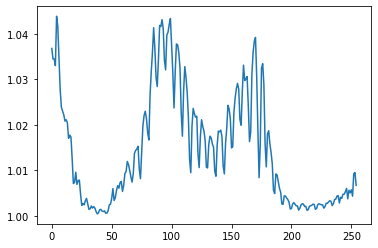

In [126]:
plt.plot(mles[40:]        )

In [36]:
predicted= [0] * len(mles)
predicted[0]=1

for i in range(1,len(predicted)):
    
    predicted[i]=mles[i-1]*predicted[i-1]
    
plt.plot(predicted)
plt.show()
plt.plot(infec)
plt.show()


In [16]:
len(infec)

297

## baysian

In [51]:
def divide_chunks(l, n): 
    yield np.array([l[0]])
    # looping till length l 
    for i in range(1, len(l), n):  
        yield l[i:i + n] 

        
def divide_and_sum(indec, k):
    divided = list(divide_chunks(indec, k)) 
#     sums=[sum(arri) for arri in divided]
    return divided

def calc_branch(data,k):
    
    T=len(data)
    if (T-1)%k != 0:
        pass
    
    else:

        m=(T-1)/k
        div=divide_and_sum(data,5)
        up=sum(div[-1])
        down=sum(div[-2])
    


   
        return up/down

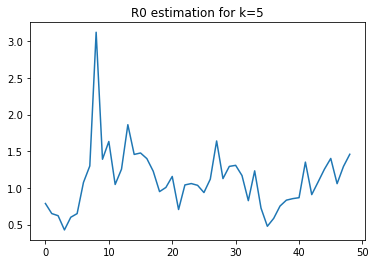

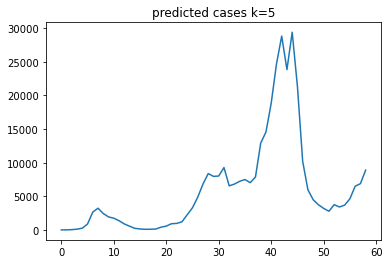

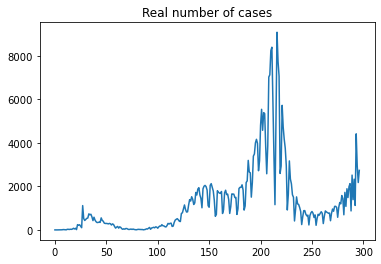

In [110]:
k=5
ro=[]

for i in range(2,len(infec)):
   
    r0=calc_branch(infec[:i],k)
    ro.append(r0)
    
g = [i for i in ro if i] 

plt.plot(g[10:])
plt.title(f'R0 estimation for k={k}')
plt.show()

predicted= [0] * len(g)
predicted[0]=1

for i in range(1,len(predicted)):
    
    predicted[i]=g[i-1]*predicted[i-1]
    
plt.plot(predicted)
plt.title(f'predicted cases k={k}')
plt.show()
plt.plot(infec)
plt.title(f'Real number of cases')

plt.show()

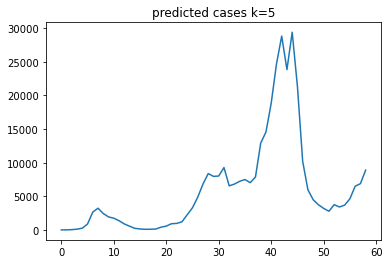

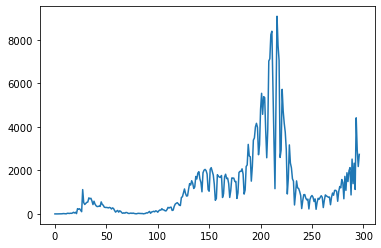

## GARBAGE

In [52]:
def calc_branch(data,k):
    print ('start')
    T=len(data)
    m=(T//k)+1
    print (f'T {T}')
    div=divide_and_sum(data,5)
    print (div)
    print (f'len {len(div)}')
    
    up=0
    down=1
    print (f'm is {m}')
    for i in range(1,m):
        if m==1:
            m=2
        
        print (f'i {i}')
        print (f'iiiii {sum(div[i])}')
        print (f'iiiii-1 {sum(div[i-1])}')

        up=up+sum(div[i])
        down=down+sum(div[i-1])
        
    
   
    return up/down